- By: Alex Kwon
- Email: alex.kwon [at] hudsonthames [dot] org
- Reference 1: [Online Portfolio Selection](https://books.google.com/books/about/Online_Portfolio_Selection.html?id=R2fdCgAAQBAJ) by Li and Hoi
- Reference 2: [Confidence Weighted Mean Reversion Strategy for Online Portfolio Selection](https://dl.acm.org/doi/pdf/10.1145/2435209.2435213)
- Reference 3: [Robust Median Reversion Strategy for Online Portfolio Selection](https://www.ijcai.org/Proceedings/13/Papers/296.pdf)
- Reference 3: [Online Portfolio Selection for Moving Average Reversion](https://arxiv.org/pdf/1206.4626.pdf)
- Reference 4: [PAMR: Passive-Aggressive Mean Reversion Strategy for Portfolio Selection](https://ink.library.smu.edu.sg/cgi/viewcontent.cgi?article=3295&context=sis_research)

# Online Portfolio Selection - Mean Reversion

## Abstract

Mean Reversion is another effective quantiative strategy, which is based on the theory that the prices will revert back to its historical prices. A very basic example of mean reversion follows the benchmark of Constant Rebalanced Portfolio. By setting a certain predetermined allocation of weight to capital, the portfolio shifts its weights from increasing assets to decreasing assets. This module will implement four types of mean reversion strategies: Passive Aggressive Mean Reversion, Confidence Weighted Mean Reversion, Online Moving Average Reversion, and Robust Median Reversion.

Passive Aggressive Mean Reversion switches between two strategy, passive and aggressive, based on a threshold value. If the current portfolio returns fall below the threshold, the strategy will perform a passive reversion whereas portfolio returns higher than the returns will indicate an aggressive switch to mean reversion. PAMR is an effective method in preventing the strategy to allocate its weights on plummeting assets.

Constant Weighted Mean Reversion takes in a autocovariance matrix to calculate returns. It not only takes in the change in first order, but also looks at changes in second order to look for mean reversion tendencies. However, the initial analysis from this notebook indicate a high reliance on hyperparameters.

Online Moving Average Reversion looks to revert back to the moving average of the prices. OLMAR produces one of the highest returns from any dataset. The exponential returns are very promising, and with the correct selection of window value for simple moving average and alpha value for exponential moving average, OLMAR has the potential to be an extremely profitable selection strategy.

Robust Median Reversion extends OLMAR by reverting back to the L1 median of historical prices. By removing the effect of possible outliers, RMR can deal with noisy financial data to revert back to its historical price. Along with OLMAR, RMR returns indicate a strong potential for applications.

A problem that we see with mean reversion strategies is the strong effect of hyperparameters. A lot of these hyperparameters have been chosen by looking at the data in hindsight. Fundamental analysis of each dataset and market structure is required to profitably implement this strategy in a real-time market scenario.

**1. Passive Aggressive Mean Reversion**
   - PAMR
   - PAMR-1
   - PAMR-2
   
**2. Online Moving Average Reversion**
   - OLMAR-1
   - OLMAR-2

**3. Confidence Weighted Mean Reversion**
   - CWMR-Var
   - CWMR-SD

**4. Robust Median Reversion**
    
**5. Data Exploration**
   - NYSE: 1962-1984
   - DJIA: 2001-2003
   - TSE: 1994-1998
   - SP500: 1998-2003
   - MSCI: 1993-2020
   - US Equity: 2011-2020

# Strategy

Throughout the next couple weeks, we will be releasing notebooks on the following strategies

[**Benchmarks**](https://github.com/hudson-and-thames/research/blob/master/Online%20Portfolio%20Selection/Introduction%20to%20Online%20Portfolio%20Selection.ipynb)
- Buy and Hold
- Best Stock
- Constant Rebalanced Portfolio
- Best Constant Rebalanced Portfolio

[**Momentum**](https://github.com/hudson-and-thames/research/blob/master/Online%20Portfolio%20Selection/Online%20Portfolio%20Selection%20-%20Momentum.ipynb)
- Exponential Gradient
- Follow the Leader
- Follow the Regularized Leader

**Mean Reversion**
- Confidence Weighted Mean Reversion
- Passive Aggressive Mean Reversion
- Online Moving Average Reversion
- Robust Median Reversion

**Pattern Matching**
- Correlation Driven Nonparametric Learning (CORN)
- CORN-U
- CORN-K
- Symmetric CORN (SCORN)
- Functional CORN (FCORN)
- SCORN-K
- FCORN-K

## 1. Passive Aggressive Mean Reversion

Passive Aggressive Mean Reversion alternates between a passive and aggressive approach to the current market conditions. The strategy can effectively prevent a huge loss and maximize returns by setting a threshold for mean reversion.

PAMR takes in a variable $\epsilon$, a threshold for market condition. If the portfolio returns for the period is below $\epsilon$, then PAMR will passively keep the previous portfolio, whereas if the returns are above the threshold, the portfolio will actively rebalance to the less performing assets.

$\epsilon$ can be interpreted as the maximum loss for the portfolio. It is most likely that the asset that decreased in prices for the period will bounce back, but there are cases where some companies plummet in value. PAMR is an effective algorithm that will be able to prevent huge losses in blindly following these assets.

PAMR defines a loss function

<center>$l_{\epsilon} (b; x_t)$</center>

If the returns for the period are below the threshold, $\epsilon$,

<center>$l_{\epsilon} (b; x_t) = 0$.</center>

For returns that are higher than $\epsilon$,

<center>$l_{\epsilon} (b; x_t) = b \cdot x_t - \epsilon$.</center>

Typically, $\epsilon$ is set at a value between 0 and 1 and closer to 1. Daily returns average around 1 as the portfolio typically does not drastically change in value.

If we set the $\epsilon$ to be 0.8, the strategy will choose an aggressive strategy if the period's total returns is above 0.8 and choose a passive strategy for any returns above 0.8.

There are three versions of Passive Aggressive Mean Reversion that we will be introducing in this notebook: PAMR, PAMR-1, and PAMR-2

Each reversion methods will return a specific $\tau$ value for the following update algorithm.

<center>$b_{t+1} = b_t - \tau_t(x_t - \bar x_t\textbf{1})$</center>

where $\bar x_t$ is the average of relative returns for the period.

### 1.1 PAMR

The first method is described as the following optimization problem:

<center>$b_{t+1} = \underset{b \in \Delta_m}{\arg\min} \frac{1}{2} \|b-b_t \|^2 \: \text{s.t.} \: l_{\epsilon}(b;x_t)=0$</center>

The next portfolio weights are determined by minimizing the deviation from the current weights. This is an example of a passive approach to have our loss function equal 0.

<center>$\tau_t = \frac{l_{\epsilon}^t}{ \| x_t - \bar x_t \textbf{1}\|^2}$</center>

### 1.2 PAMR-1

PAMR-1 introduces a slack variable to PAMR.

$C$ is a positive parameter that can be interpreted as the aggressiveness of the strategy.


<center>$b_{t+1} = \underset{b \in \Delta_m}{\arg\min} \left\lbrace\frac{1}{2} \|b-b_t \|^2 + C\xi\right\rbrace \: \text{s.t.} \: l_{\epsilon}(b;x_t) \leq \xi \geq 0$</center>

<center>$\tau_t = \min \left\lbrace C, \frac{l_{\epsilon}^t}{ \| x_t - \bar x_t \textbf{1}\|^2}\right\rbrace$</center>

### 1.2 PAMR-2

PAMR-2 contains a quadratic term to the original slack variable from PAMR-1. 

<center>$b_{t+1} = \underset{b \in \Delta_m}{\arg\min} \left\lbrace\frac{1}{2} \|b-b_t \|^2 + C\xi^2 \right\rbrace \: \text{s.t.} \: l_{\epsilon}(b;x_t) \leq \xi$</center>

<center>$\tau_t = \frac{l_{\epsilon}^t}{ \| x_t - \bar x_t \textbf{1}\|^2 + \frac{1}{2C}}$</center>

Each of these strategies can be called using **PassiveAggressiveMeanReversion()**.

    - PAMR: PassiveAggressiveMeanReversion(0, epsilon=0.8, agg=10)
    - PAMR-1: PassiveAggressiveMeanReversion(0, epsilon=0.5, agg=1)
    - PAMR-2: PassiveAggressiveMeanReversion(0, epsilon=0.9, agg=100)

## 2. Confidence Weighted Mean Reversion

Extending from PAMR, Confidence Weighted Mean Reversion looks at the autocovariances across all assets. Instead of just focusing on a single asset's deviation from the original price, CWMR takes in second-order information about the portfolio vector as well to formualte a set of weights.

For CWMR, we introduce $\sum$, a measure of anti-confidence in the portfolio weights, where a smaller value represents a higher confidence for the corresponding portfolio weights.

The optimization problem therefore becomes:

<center>$(\mu_{t+1}, \Sigma_{t+1}) = \arg \min D_{KL}(N(\mu,\Sigma | N(\mu_t,\Sigma_t)))$</center>

<center>such that $Pr[b^{\top \cdot x_t \leq \epsilon}] \geq \theta$ and $\mu \in \Delta_m$</center>

Here the problem can be interpreted as maximizing the portfolio confidence by minimizing $\Sigma$ given a certain confidence interval $\theta$, which is determined by the threshold, $\epsilon$.

CWMR has two variations to solve this optimization problem with CWMR-SD and CWMR-Var.

### 2.1 CWMR-Var

<center>$(\mu_{t+1}, \Sigma_{t+1}) = \arg \min \frac{1}{2} \left( \log(\frac{\det \Sigma_t}{\det \Sigma}) + Tr(\Sigma_t^{-1}\Sigma) + (\mu_t-\mu)^{\top}\Sigma_t^{-1}(\mu_t - \mu) \right)$</center>

<center>such that $\epsilon - \mu^{\top}\cdot x_t \geq \phi x_t^{\top} \Sigma x_t$, $\mu^{\top} \cdot \textbf{1} = 1$, and $\mu \geq 0$</center>

### 2.1 CWMR-SD
<center>$(\mu_{t+1},\Gamma_{t+1}) = \arg \min \frac{1}{2}\left(\log(\frac{\det \Gamma_t^2}{\det \Gamma^2}) +Tr(\Gamma_t^{-2}\Gamma^2) + (\mu_t - \mu)^{\top}\Gamma_t^{-2}(\mu_t -\mu) \right)$</center>

<center>such that $\epsilon - \mu^{\top}\cdot x_t \geq \phi || \Gamma x_t ||$, $\Gamma$ is a PSD, $\mu^{\top} \cdot \textbf{1} = 1$, and $\mu \geq 0$</center>

Each of these strategies can be called using **ConfidenceWeightedMeanReversion()**.

    - CWMR-Var: ConfidenceWeightedMeanReversion(confidence=0.5, epsilon=0.5, method='var')
    - CWMR-SD: ConfidenceWeightedMeanReversion(confidence=0.3, epsilon=0.8, method='sd')

## 3. Online Moving Average Reversion

Unlike traditional reversion methods that rely on single period reversion, where the strategy looks to revert based on only the last period's data, OLMAR looks to revert to the moving average of price data.

Traditional mean reversion techniques have an underlying assumption that the next price relative is inversely proportional to the latest price relative. However, often times mean reversion trends are not limited to a single period and extend for a longer period.

OLMAR proposes two different moving average methods: Simple Moving Average and Exponential Moving Average.

From these moving average methods, the strategy predicts the next period's price relative. Using this new prediction, the portfolio iteratively updates its new weights.

<center>$b_{t+1} = b_t + \lambda_{t+1}(\tilde{x}_{t+1}-\bar x_{t+1}\textbf{1})$</center>

$\lambda$ is the constant multiplier to the new weights, and it is determined by the deviation from $\epsilon$, the reversion threshold. The portfolio will look to rebalance itself to the underperforming assets only if the portfolio returns are lower than the $\epsilon$ value.

<center>$\lambda_{t+1} = max \left\lbrace 0, \frac{\epsilon-b_t \cdot \tilde{x}_{t+1}}{\|\tilde{x}_{t+1}-\bar x_{t+1} \textbf{1}\|^2}\right\rbrace$</center>


### 3.1 OLMAR-1

The first OLMAR method looks at the simple moving average(SMA) of historical prices.

<center>$\tilde{x}_{t+1}(w) = \frac{SMA_t(w)}{p_t}$</center>


<center>$= \frac{1}{w} \left(\frac{p_t}{p_t} + \frac{p_{t-1}}{p_t}+ \cdot \cdot \cdot + \frac{p_{t-w+1}}{p_t}\right)$</center>


<center>$= \frac{1}{w} \left( 1+ \frac{1}{x_t}+ \cdot \cdot \cdot + \frac{1}{\odot^{w-2}_{i=0}x_{t-1}} \right)$</center>



### 3.1 OLMAR-2

The second OLMAR method looks at the exponential moving average(EMA) of historical prices.

<center>$\tilde{x}_{t+1}(\alpha) = \frac{EMA_t(\alpha)}{p_t}$</center>
<center>$= \frac{\alpha p_t+(1-\alpha)EMA_{t-1}(\alpha)}{p_t}$</center>
<center>$= \alpha \textbf{1} + (1 - \alpha) \frac{EMA_{t-1}(\alpha)}{p_{t-1}}\frac{p_{t-1}}{p_t}$</center>
<center>$= \alpha \textbf{1} + (1 - \alpha) \frac{\tilde{x_t}}{x_t}$</center>

Each of these strategies can be called using **OnlineMovingAverageReversion()**.

    - OLMAR-1: OnlineMovingAverageReversion(1, epsilon=1.1, window=5)
    - OLMAR-2: OnlineMovingAverageReversion(2, epsilon=1.4, alpha=0.5)

## 4. Robust Median Reversion

Robust Median Reversion extends the previous Online Moving Average Reversion by introducing L1 median of the specified windows. Instead of reverting to a moving average, RMR reverts to the L1 median estimator. L1 median estimator provides a more effective method of predicting the next period's price because financial data is inherently noisy and contains many outliers.

Similarly to other mean reversion techniques, RMR predicts the next period's price and seeks to maximize the returns from the given portfolio weights and also adhere to the current portfolio weights.

L1-median is calculated with the following equation:
<center>$\mu = \underset{\mu}{\arg \min}\overset{k-1}{\underset{i=0}{\sum}}||p_{t-i} - \mu ||$</center>

k is the number of historical price windows, and $\mu$ represents the predicted value.

The calculation of L1-median is computationally inefficient, so the algorithm will be using the Modified Weiszfeld Algorithm.

<center>$\hat{x}_{t+1} = T(\mu) = (1 - \frac{\eta(\mu)}{\gamma(\mu)})^+ \: \tilde{T}(\mu + \min(1,\frac{\eta{\mu}}{\gamma(\mu)})\mu$</center>

<center>$\eta(\mu) = 1 \text{ if } \mu=\text{any price and } 0 \text{ otherwise}$</center>

<center>$\gamma(\mu)=\left|\left|\underset{p_{t-i} \neq \mu}{\sum}\frac{p_{t-i}-\mu}{||p_{t-i}-\mu||}\right|\right|$</center>

<center>$\tilde{T}(\mu)=\left\lbrace \underset{p_{t-i}\neq \mu}{\sum}\frac{1}{||p_{t-i}-\mu||}\right\rbrace^{-1}\underset{p_{t-i}\neq \mu}{\sum}\frac{p_{t-i}}{||p_{t-i}-\mu||}$</center>

The next portfolio weights will be updated as following

<center>$b_{t+1} = b_{t} - \min \left \lbrace 0, \frac{\hat{x}_{t+1} b_t-\epsilon}{||\hat{x}_{t+1}-\bar{x}_{t+1}\cdot\textbf{1}||^2}\right \rbrace \cdot (\hat{x}_{t+1}-\bar{x}_{t+1}\cdot\textbf{1})$</center>

In [1]:
import pandas as pd
import numpy as np
import pickle
import optuna
import matplotlib.pyplot as plt
from mlfinlab.online_portfolio_selection import *
import plotly.offline as py
import plotly.graph_objs as go
import plotly.io as pio
from plotly.subplots import make_subplots
pio.renderers.default = "svg" # Toggle for GitHub rendering

## Import Data

More information on these datasets is available [here](https://github.com/hudson-and-thames/research/blob/master/Online%20Portfolio%20Selection/Data%20Selection.ipynb).

In [2]:
msci = pd.read_csv('data/MSCI.csv', parse_dates=True, index_col='Date').dropna()[1:]
us_equity = pd.read_csv('data/US_Equity.csv', parse_dates=True, index_col='Date')
djia = pd.read_csv('data/DJIA.csv', parse_dates=True, index_col='Date')
nyse = pd.read_csv('data/NYSE.csv', parse_dates=True, index_col='Date')
sp500 = pd.read_csv('data/SP500.csv', parse_dates=True, index_col='Date')
tse = pd.read_csv('data/TSE.csv', parse_dates=True, index_col='Date')

## 5.1 NYSE: 1961-1984

In [55]:
nyse_pamr0 = optuna.load_study(study_name='pamr0', storage='sqlite:///stored/nyse.db')
nyse_pamr1 = optuna.load_study(study_name='pamr1', storage='sqlite:///stored/nyse.db')
nyse_pamr2 = optuna.load_study(study_name='pamr2', storage='sqlite:///stored/nyse.db')
nyse_cwmrsd = optuna.load_study(study_name='cwmrsd', storage='sqlite:///stored/nyse.db')
nyse_cwmrvar = optuna.load_study(study_name='cwmrvar', storage='sqlite:///stored/nyse.db')
nyse_olmar1 = optuna.load_study(study_name='olmar1_large', storage='sqlite:///stored/nyse.db')
nyse_olmar2 = optuna.load_study(study_name='olmar2_large', storage='sqlite:///stored/nyse.db')
nyse_rmr = optuna.load_study(study_name='rmr', storage='sqlite:///stored/nyse.db')

### PAMR

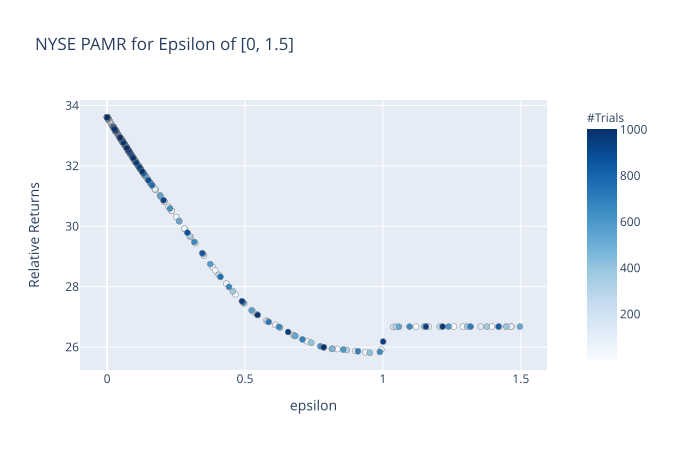

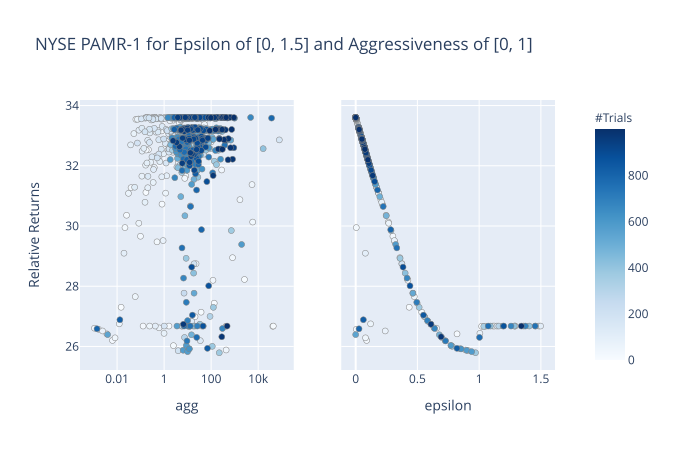

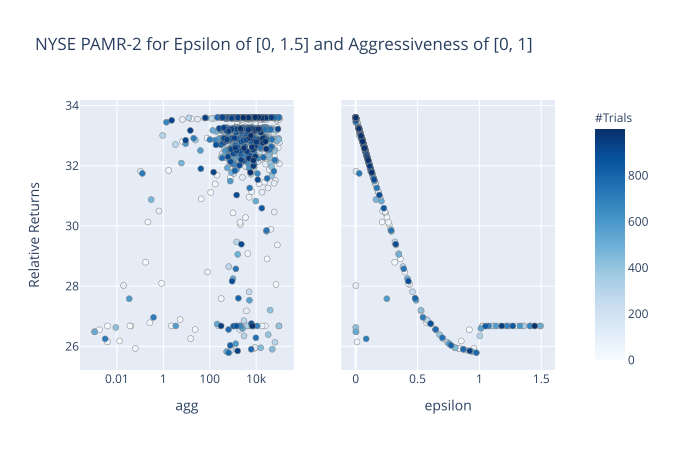

In [56]:
fig = optuna.visualization.plot_slice(nyse_pamr0)
fig.update_layout(title_text="NYSE PAMR for Epsilon of [0, 1.5]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(nyse_pamr1)
fig.update_layout(title_text="NYSE PAMR-1 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(nyse_pamr2)
fig.update_layout(title_text="NYSE PAMR-2 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

PAMR results on NYSE indicate the dependency on epsilon value over agg(aggressiveness). A low value of epsilon, one that is close to 0, is ideal in this strategy. A low value of epsilon indicates the passive mean reversion. For this set of data, PAMR did not have variance over the different methods and had the passive strategy return higher than the aggressive strategy.

### CWMR

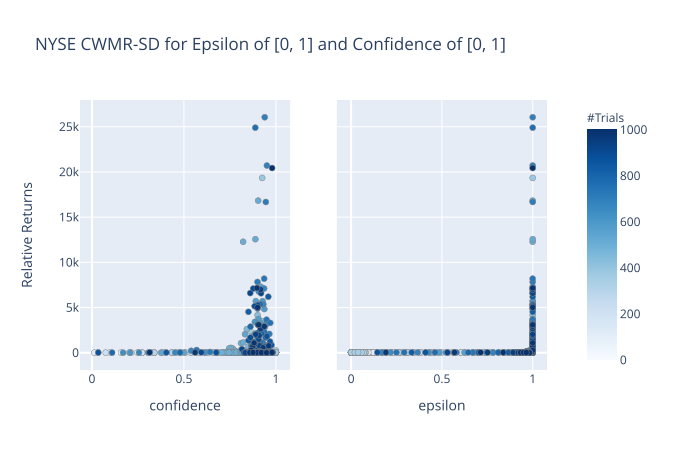

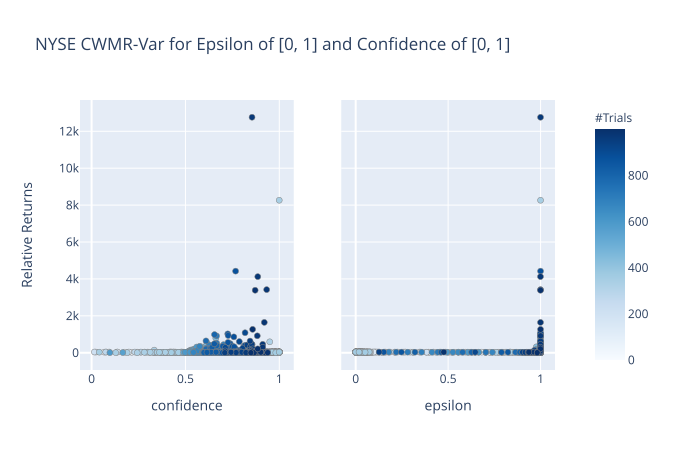

In [57]:
fig = optuna.visualization.plot_slice(nyse_cwmrsd)
fig.update_layout(title_text="NYSE CWMR-SD for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(nyse_cwmrvar)
fig.update_layout(title_text="NYSE CWMR-Var for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

CWMR results are varied over the intervals of confidence and epsilon. The overwhelming majority of the trials returned around the same magnitude. However, for certain confidence and epsilon parameters, CWMR produced extremely high returns. The interval for those parameters indicates that epsilon of 1 typically result as high returns. The variance is explained by epsilon's change instead of that caused by the confidence.

### OLMAR

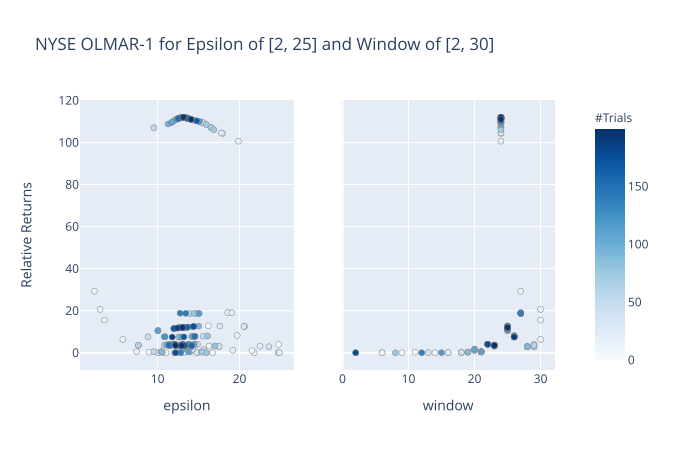

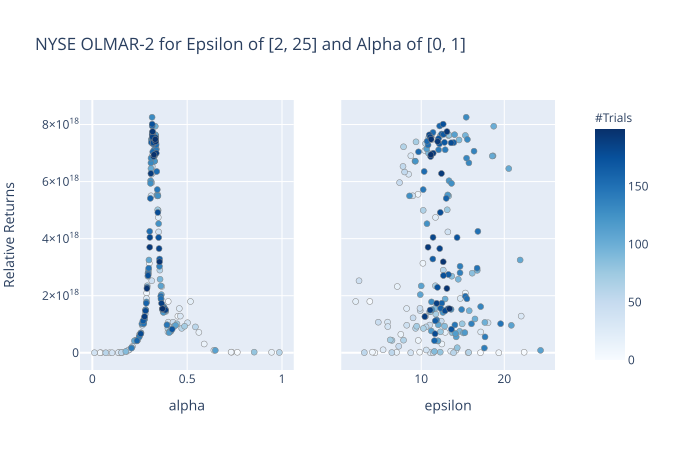

In [58]:
fig = optuna.visualization.plot_slice(nyse_olmar1)
fig.update_layout(title_text="NYSE OLMAR-1 for Epsilon of [2, 25] and Window of [2, 30]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(nyse_olmar2)
fig.update_layout(title_text="NYSE OLMAR-2 for Epsilon of [2, 25] and Alpha of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

OLMAR's returns are exponentially higher than other mean reversion techniques so far with magnitudes of 10e18. The strategy is much more dependent on the window and alpha value rather than epsilon. Interestingly, a window of 23 was ideal for OLMAR-1 and alpha of 0.35 was ideal of OLMAR-2.

### RMR

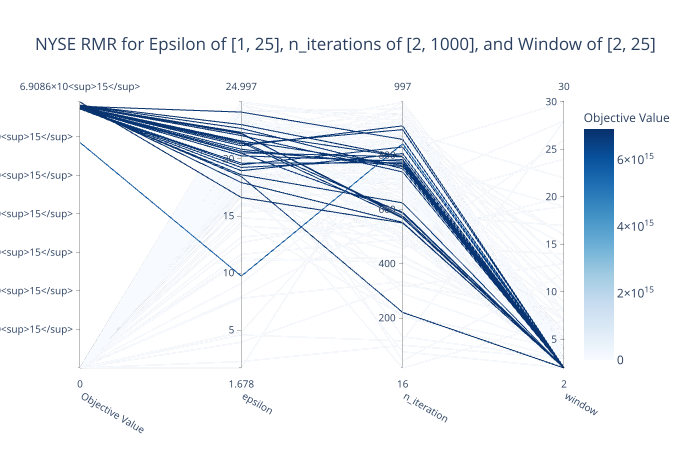

In [59]:
fig = optuna.visualization.plot_parallel_coordinate(nyse_rmr)
fig.update_layout(title_text="NYSE RMR for Epsilon of [1, 25], n_iterations of [2, 1000], and Window of [2, 25]", yaxis_title_text="Relative Returns")
display(fig)

RMR also returned extremely high returns. Typically higher number of iterations and higher value of epsilon produced profitable returns. However, the most important factor for RMR was the number of window. A window value of 2 was the main driving parameter for RMR.

In [60]:
nyse_bah = BuyAndHold()
nyse_bah.allocate(nyse)
nyse_crp = ConstantRebalancedPortfolio()
nyse_crp.allocate(nyse)

In [61]:
nyse_pamr0_ = PassiveAggressiveMeanReversion(0, nyse_pamr0.best_params['epsilon'])
nyse_pamr1_ = PassiveAggressiveMeanReversion(1, nyse_pamr1.best_params['epsilon'], nyse_pamr1.best_params['agg'])
nyse_pamr2_ = PassiveAggressiveMeanReversion(2, nyse_pamr2.best_params['epsilon'], nyse_pamr2.best_params['agg'])
nyse_cwmrsd_ = ConfidenceWeightedMeanReversion(nyse_cwmrsd.best_params['confidence'], nyse_cwmrsd.best_params['epsilon'],'sd')
nyse_cwmrvar_ = ConfidenceWeightedMeanReversion(nyse_cwmrvar.best_params['confidence'], nyse_cwmrvar.best_params['epsilon'],'var')
nyse_olmar1_ = OnlineMovingAverageReversion(1, nyse_olmar1.best_params['epsilon'], window=nyse_olmar1.best_params['window'])
nyse_olmar2_ = OnlineMovingAverageReversion(2, nyse_olmar2.best_params['epsilon'], alpha=nyse_olmar2.best_params['alpha'])
nyse_rmr_ = RobustMedianReversion(nyse_rmr.best_params['epsilon'], nyse_rmr.best_params['n_iteration'], nyse_rmr.best_params['window'])

In [62]:
nyse_pamr0_.allocate(nyse);
nyse_pamr1_.allocate(nyse);
nyse_pamr2_.allocate(nyse);
nyse_cwmrsd_.allocate(nyse);
nyse_cwmrvar_.allocate(nyse);
nyse_olmar1_.allocate(nyse);
nyse_olmar2_.allocate(nyse);
nyse_rmr_.allocate(nyse);

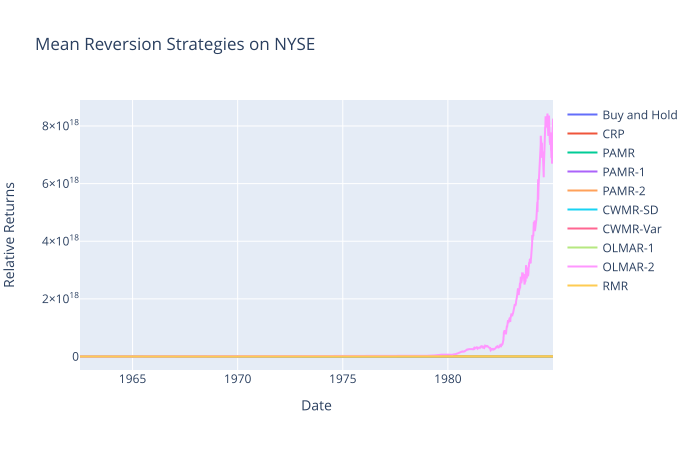

In [73]:
fig = go.Figure()
idx = nyse_bah.portfolio_return.index
fig.add_trace(go.Scatter(x=idx, y=nyse_bah.portfolio_return['Returns'], name="Buy and Hold"))
fig.add_trace(go.Scatter(x=idx, y=nyse_crp.portfolio_return['Returns'], name="CRP"))
fig.add_trace(go.Scatter(x=idx, y=nyse_pamr0_.portfolio_return['Returns'], name="PAMR"))
fig.add_trace(go.Scatter(x=idx, y=nyse_pamr1_.portfolio_return['Returns'], name="PAMR-1"))
fig.add_trace(go.Scatter(x=idx, y=nyse_pamr2_.portfolio_return['Returns'], name="PAMR-2"))
fig.add_trace(go.Scatter(x=idx, y=nyse_cwmrsd_.portfolio_return['Returns'], name="CWMR-SD"))
fig.add_trace(go.Scatter(x=idx, y=nyse_cwmrvar_.portfolio_return['Returns'], name="CWMR-Var"))
fig.add_trace(go.Scatter(x=idx, y=nyse_olmar1_.portfolio_return['Returns'], name="OLMAR-1"))
fig.add_trace(go.Scatter(x=idx, y=nyse_olmar2_.portfolio_return['Returns'], name="OLMAR-2"))
fig.add_trace(go.Scatter(x=idx, y=nyse_rmr_.portfolio_return['Returns'], name="RMR"))
fig.update_layout(title='Mean Reversion Strategies on NYSE', xaxis_title='Date', yaxis_title='Relative Returns')
fig.show()

OLMAR-2 outpaces every other strategy by a huge margin, so we will look at the graph in a logarithmic scale.

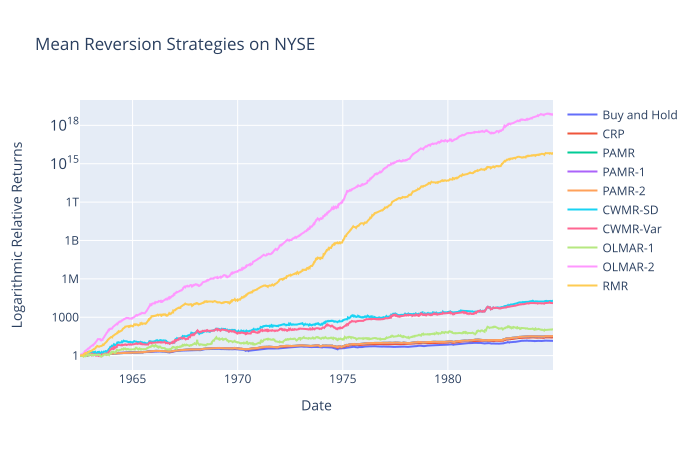

In [74]:
fig.update_layout(yaxis_type="log", yaxis_title='Logarithmic Relative Returns')
fig.show()

Rest of the strategies are more visible with RMR being a distant second. Both CWMR strategies returns are relatively higher than the rest of mean reversion strategies.

## 5.2 DJIA: 2001-2003

In [4]:
djia_pamr0 = optuna.load_study(study_name='pamr0', storage='sqlite:///stored/djia.db')
djia_pamr1 = optuna.load_study(study_name='pamr1', storage='sqlite:///stored/djia.db')
djia_pamr2 = optuna.load_study(study_name='pamr2', storage='sqlite:///stored/djia.db')
djia_cwmrsd = optuna.load_study(study_name='cwmrsd', storage='sqlite:///stored/djia.db')
djia_cwmrvar = optuna.load_study(study_name='cwmrvar', storage='sqlite:///stored/djia.db')
djia_olmar1 = optuna.load_study(study_name='olmar1_large', storage='sqlite:///stored/djia.db')
djia_olmar2 = optuna.load_study(study_name='olmar2_large', storage='sqlite:///stored/djia.db')
djia_rmr = optuna.load_study(study_name='rmr', storage='sqlite:///stored/djia.db')

### PAMR

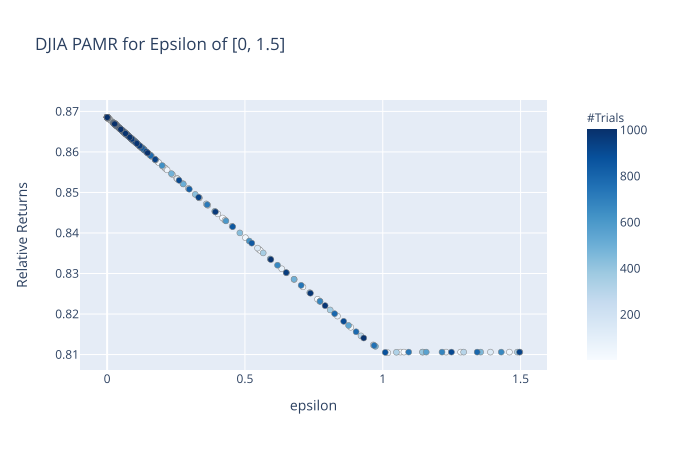

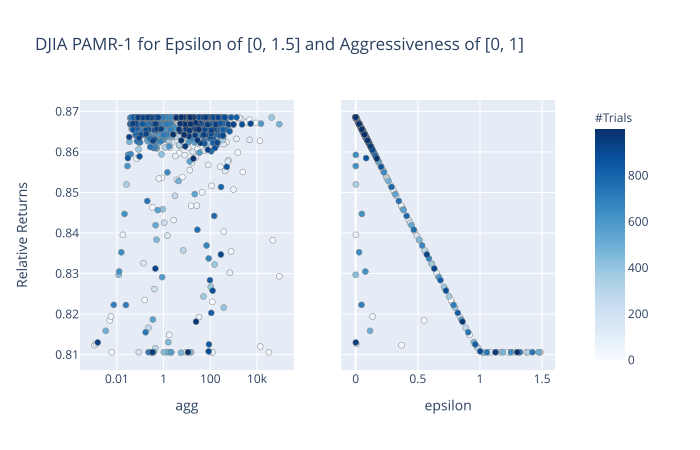

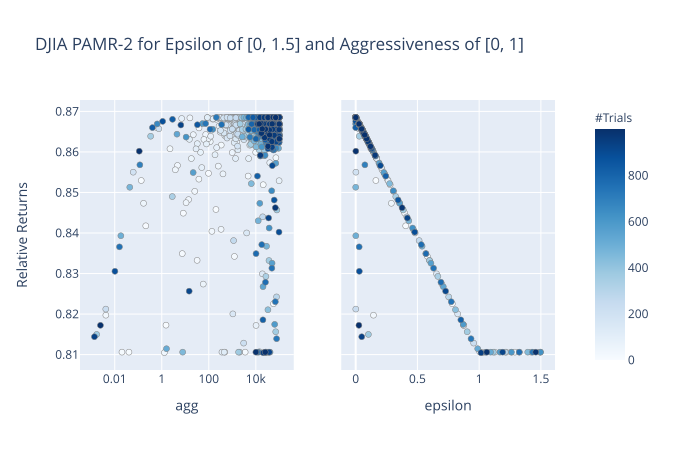

In [54]:
fig = optuna.visualization.plot_slice(djia_pamr0)
fig.update_layout(title_text="DJIA PAMR for Epsilon of [0, 1.5]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(djia_pamr1)
fig.update_layout(title_text="DJIA PAMR-1 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(djia_pamr2)
fig.update_layout(title_text="DJIA PAMR-2 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Similarly to NYSE, DJIA data is dependent on the epsilon parameter. Lower value of epsilon, closer to 0, produced higher returns regardless of agg.

### CWMR

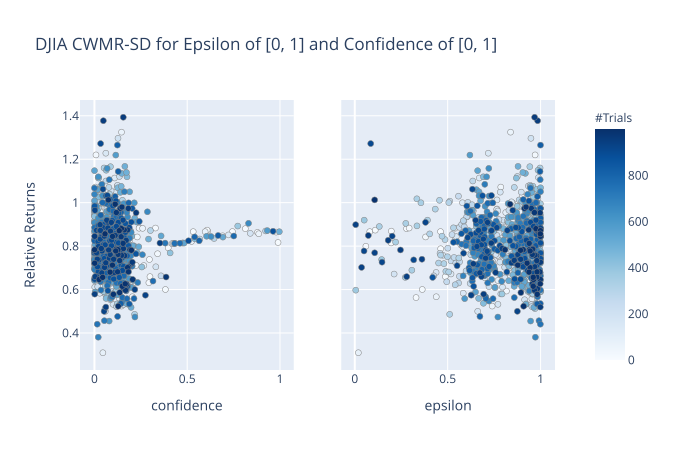

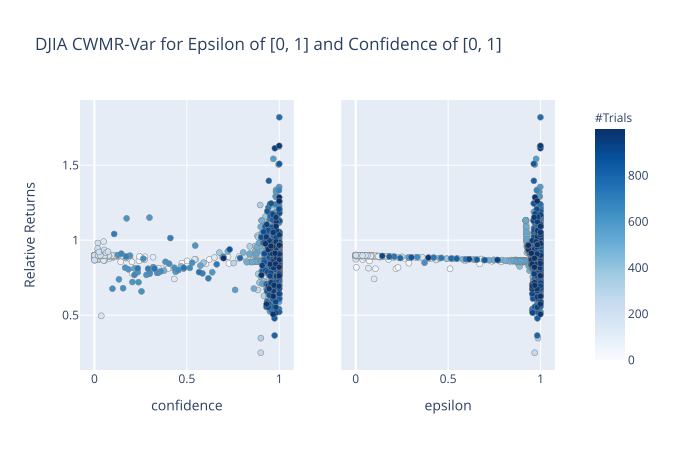

In [6]:
fig = optuna.visualization.plot_slice(djia_cwmrsd)
fig.update_layout(title_text="DJIA CWMR-SD for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(djia_cwmrvar)
fig.update_layout(title_text="DJIA CWMR-Var for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

CWMR produces a similar graph to that of NYSE. Epsilon of 1 continues to be the ideal parameter in general; however, confidence is different for CWMR-Var and CWMR-SD. The variance method has an ideal confidence of 1, whereas the standard deviation method returns a confidence that is closer to 0.

### OLMAR

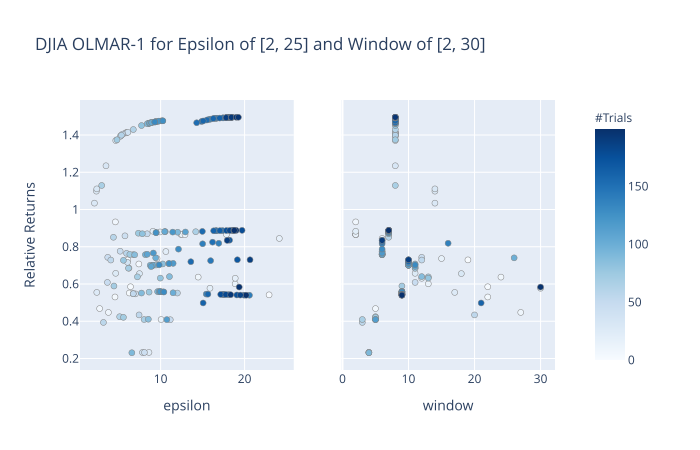

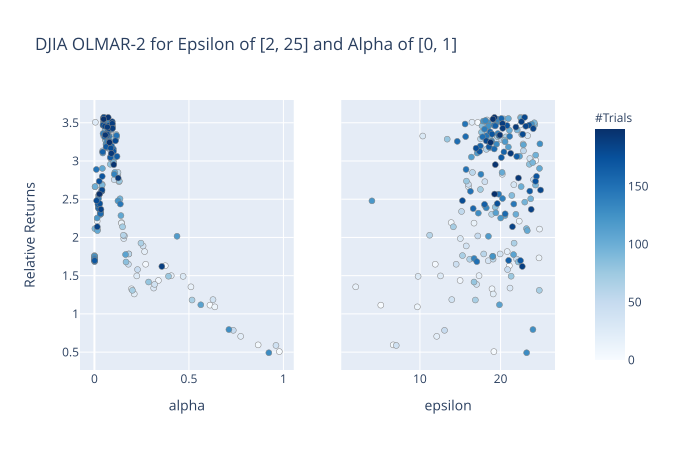

In [7]:
fig = optuna.visualization.plot_slice(djia_olmar1)
fig.update_layout(title_text="DJIA OLMAR-1 for Epsilon of [2, 25] and Window of [2, 30]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(djia_olmar2)
fig.update_layout(title_text="DJIA OLMAR-2 for Epsilon of [2, 25] and Alpha of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

OLMAR parameters suggest a similar trend where epsilon parameter does not significantly affect results. Window of 8 for simple moving average, and alpha of almost 0.1 produce the highest returns.

### RMR

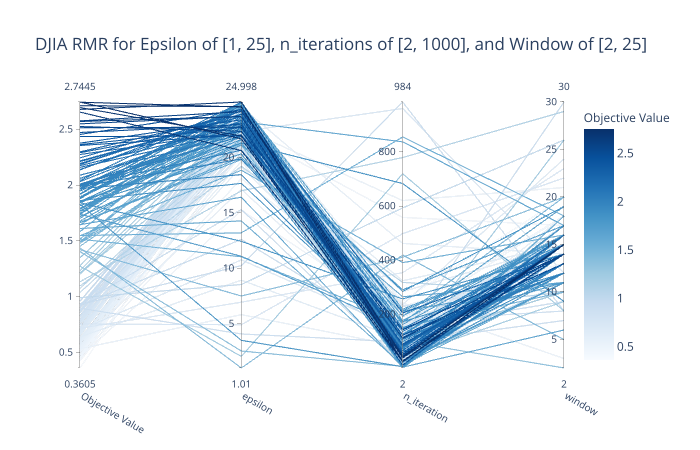

In [8]:
fig = optuna.visualization.plot_parallel_coordinate(djia_rmr)
fig.update_layout(title_text="DJIA RMR for Epsilon of [1, 25], n_iterations of [2, 1000], and Window of [2, 25]", yaxis_title_text="Relative Returns")
display(fig)

Higher returns were achieved from high epsison values, lower n_iterations, and a window range of 12 to 16. This is in contrast to the window range suggested by OLMAR-1, where 8 had the highest returns.

In [9]:
djia_bah = BuyAndHold()
djia_bah.allocate(djia)
djia_crp = ConstantRebalancedPortfolio()
djia_crp.allocate(djia)

In [10]:
djia_pamr0_ = PassiveAggressiveMeanReversion(0, djia_pamr0.best_params['epsilon'])
djia_pamr1_ = PassiveAggressiveMeanReversion(1, djia_pamr1.best_params['epsilon'], djia_pamr1.best_params['agg'])
djia_pamr2_ = PassiveAggressiveMeanReversion(2, djia_pamr2.best_params['epsilon'], djia_pamr2.best_params['agg'])
djia_cwmrsd_ = ConfidenceWeightedMeanReversion(djia_cwmrsd.best_params['confidence'], djia_cwmrsd.best_params['epsilon'],'sd')
djia_cwmrvar_ = ConfidenceWeightedMeanReversion(djia_cwmrvar.best_params['confidence'], djia_cwmrvar.best_params['epsilon'],'var')
djia_olmar1_ = OnlineMovingAverageReversion(1, djia_olmar1.best_params['epsilon'], window=djia_olmar1.best_params['window'])
djia_olmar2_ = OnlineMovingAverageReversion(2, djia_olmar2.best_params['epsilon'], alpha=djia_olmar2.best_params['alpha'])
djia_rmr_ = RobustMedianReversion(djia_rmr.best_params['epsilon'], djia_rmr.best_params['n_iteration'], djia_rmr.best_params['window'])

In [11]:
djia_pamr0_.allocate(djia);
djia_pamr1_.allocate(djia);
djia_pamr2_.allocate(djia);
djia_cwmrsd_.allocate(djia);
djia_cwmrvar_.allocate(djia);
djia_olmar1_.allocate(djia);
djia_olmar2_.allocate(djia);
djia_rmr_.allocate(djia);

/Users/alexkwon/Documents/GitHub/hudson-and-thames/mlfinlab/mlfinlab/online_portfolio_selection/mean_reversion/online_moving_average_reversion.py:106: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning



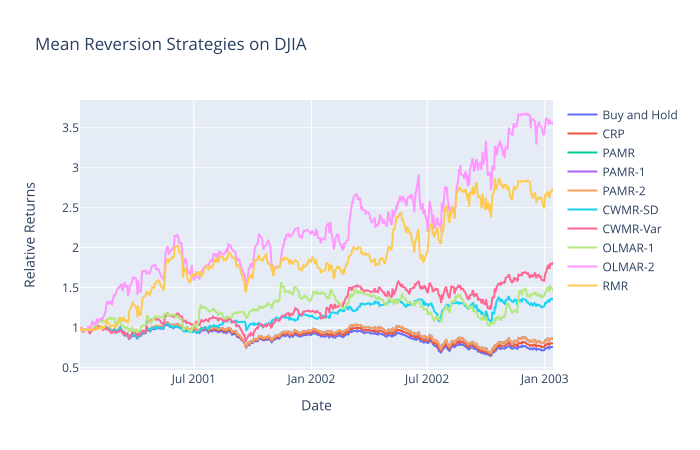

In [12]:
fig = go.Figure()
idx = djia_bah.portfolio_return.index
fig.add_trace(go.Scatter(x=idx, y=djia_bah.portfolio_return['Returns'], name="Buy and Hold"))
fig.add_trace(go.Scatter(x=idx, y=djia_crp.portfolio_return['Returns'], name="CRP"))
fig.add_trace(go.Scatter(x=idx, y=djia_pamr0_.portfolio_return['Returns'], name="PAMR"))
fig.add_trace(go.Scatter(x=idx, y=djia_pamr1_.portfolio_return['Returns'], name="PAMR-1"))
fig.add_trace(go.Scatter(x=idx, y=djia_pamr2_.portfolio_return['Returns'], name="PAMR-2"))
fig.add_trace(go.Scatter(x=idx, y=djia_cwmrsd_.portfolio_return['Returns'], name="CWMR-SD"))
fig.add_trace(go.Scatter(x=idx, y=djia_cwmrvar_.portfolio_return['Returns'], name="CWMR-Var"))
fig.add_trace(go.Scatter(x=idx, y=djia_olmar1_.portfolio_return['Returns'], name="OLMAR-1"))
fig.add_trace(go.Scatter(x=idx, y=djia_olmar2_.portfolio_return['Returns'], name="OLMAR-2"))
fig.add_trace(go.Scatter(x=idx, y=djia_rmr_.portfolio_return['Returns'], name="RMR"))
fig.update_layout(title='Mean Reversion Strategies on DJIA', xaxis_title='Date', yaxis_title='Relative Returns')
fig.show()

Mean reversion strategies perform significantly better than other benchmarks. For a period of continuous downtrend, OLMAR-2 and RMR each have triple and double returns when most other strategies are stagnant around 1. Mean reversion seems to indicate a promising strategy for a long bear market.

## 5.3 TSE: 1994-1998

In [13]:
tse_pamr0 = optuna.load_study(study_name='pamr0', storage='sqlite:///stored/tse.db')
tse_pamr1 = optuna.load_study(study_name='pamr1', storage='sqlite:///stored/tse.db')
tse_pamr2 = optuna.load_study(study_name='pamr2', storage='sqlite:///stored/tse.db')
tse_cwmrsd = optuna.load_study(study_name='cwmrsd', storage='sqlite:///stored/tse.db')
tse_cwmrvar = optuna.load_study(study_name='cwmrvar', storage='sqlite:///stored/tse.db')
tse_olmar1 = optuna.load_study(study_name='olmar1_large', storage='sqlite:///stored/tse.db')
tse_olmar2 = optuna.load_study(study_name='olmar2_large', storage='sqlite:///stored/tse.db')
tse_rmr = optuna.load_study(study_name='rmr', storage='sqlite:///stored/tse.db')

### PAMR

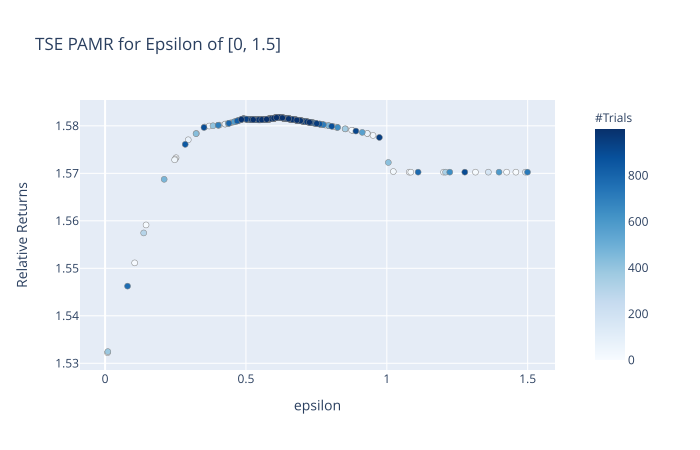

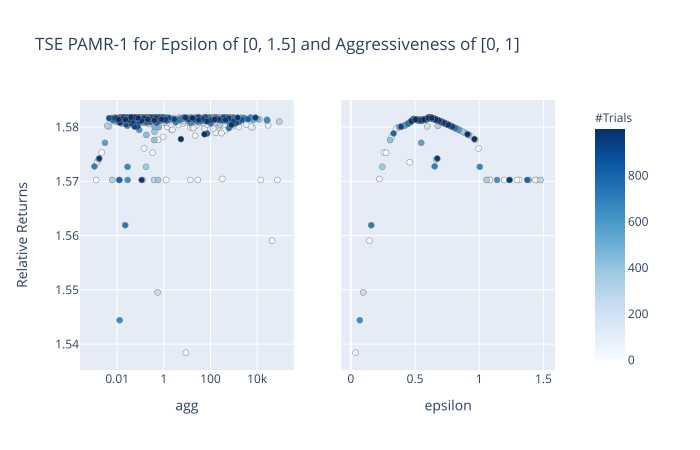

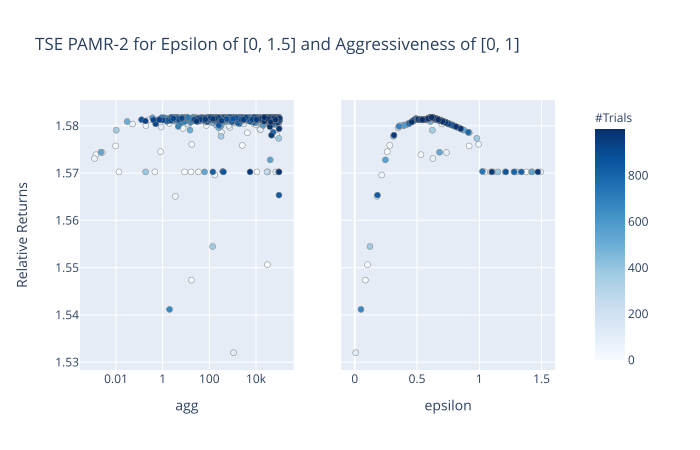

In [67]:
fig = optuna.visualization.plot_slice(tse_pamr0)
fig.update_layout(title_text="TSE PAMR for Epsilon of [0, 1.5]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(tse_pamr1)
fig.update_layout(title_text="TSE PAMR-1 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(tse_pamr2)
fig.update_layout(title_text="TSE PAMR-2 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

TSE suggests a different ideal epsilon value from the two previous datasets. Instead of 0, the best epsilon value is 0.6. The strategy performed an aggressive strategy for portfolio returns that were above 0.6 and performed a passive strategy for periods with returns less than 0.6.

### CWMR

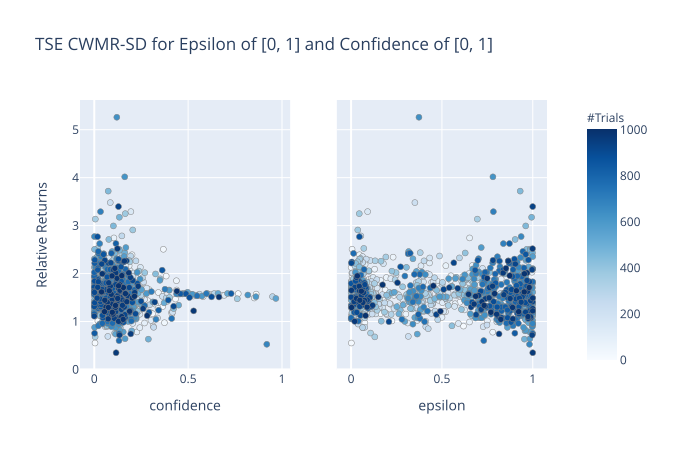

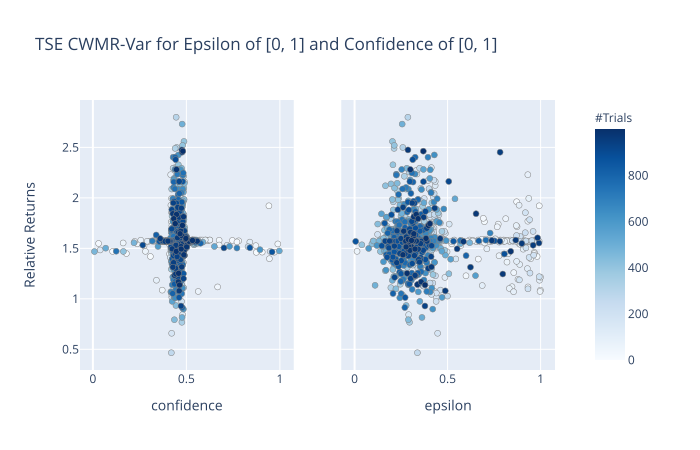

In [15]:
fig = optuna.visualization.plot_slice(tse_cwmrsd)
fig.update_layout(title_text="TSE CWMR-SD for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(tse_cwmrvar)
fig.update_layout(title_text="TSE CWMR-Var for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

CWMR parameters are very different from the previous datasets. For the standard deviation method, epsilon values have minimal affect on returns as the highest drive was the low value of Confidence around 0.1. For the variance method, confidence of 0.5 displayed significantly higher returns with epsilon not having as much effect as its other counterpart.

### OLMAR

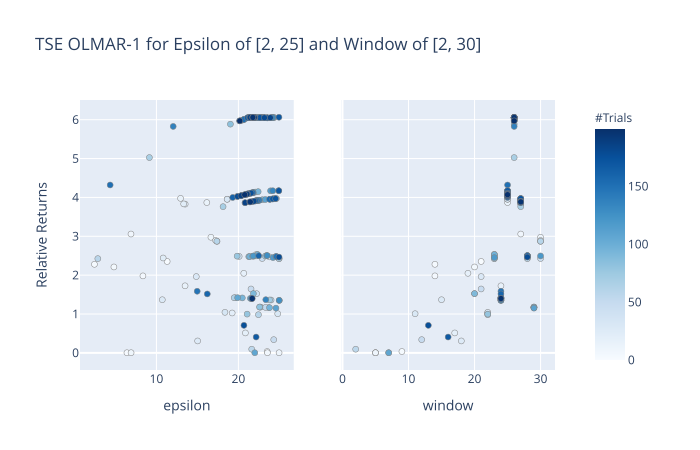

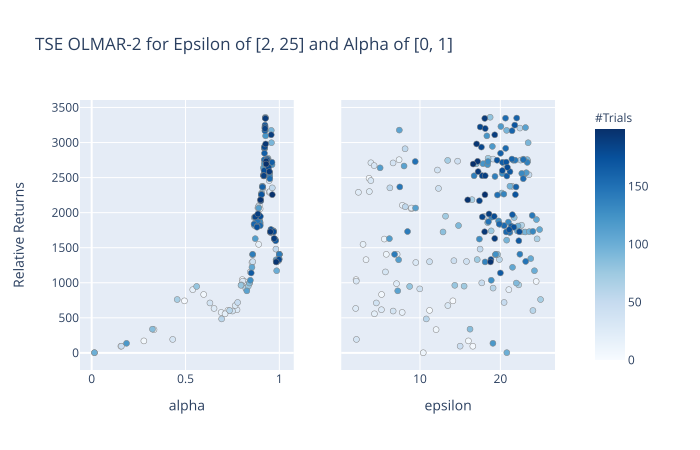

In [16]:
fig = optuna.visualization.plot_slice(tse_olmar1)
fig.update_layout(title_text="TSE OLMAR-1 for Epsilon of [2, 25] and Window of [2, 30]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(tse_olmar2)
fig.update_layout(title_text="TSE OLMAR-2 for Epsilon of [2, 25] and Alpha of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

### RMR

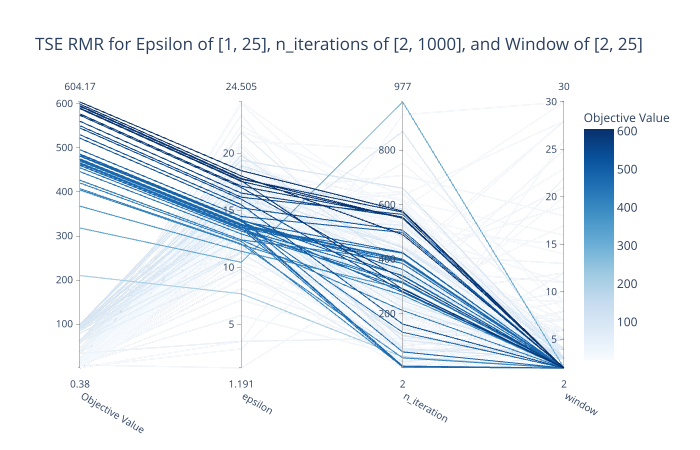

In [17]:
fig = optuna.visualization.plot_parallel_coordinate(tse_rmr)
fig.update_layout(title_text="TSE RMR for Epsilon of [1, 25], n_iterations of [2, 1000], and Window of [2, 25]", yaxis_title_text="Relative Returns")
display(fig)

RMR results indicate that the most important parameter is windows. A window of 2 had the highest returns regardless of epsilon and n_iteration value.

In [18]:
tse_bah = BuyAndHold()
tse_bah.allocate(tse)
tse_crp = ConstantRebalancedPortfolio()
tse_crp.allocate(tse)

In [19]:
tse_pamr0_ = PassiveAggressiveMeanReversion(0, tse_pamr0.best_params['epsilon'])
tse_pamr1_ = PassiveAggressiveMeanReversion(1, tse_pamr1.best_params['epsilon'], tse_pamr1.best_params['agg'])
tse_pamr2_ = PassiveAggressiveMeanReversion(2, tse_pamr2.best_params['epsilon'], tse_pamr2.best_params['agg'])
tse_cwmrsd_ = ConfidenceWeightedMeanReversion(tse_cwmrsd.best_params['confidence'], tse_cwmrsd.best_params['epsilon'],'sd')
tse_cwmrvar_ = ConfidenceWeightedMeanReversion(tse_cwmrvar.best_params['confidence'], tse_cwmrvar.best_params['epsilon'],'var')
tse_olmar1_ = OnlineMovingAverageReversion(1, tse_olmar1.best_params['epsilon'], window=tse_olmar1.best_params['window'])
tse_olmar2_ = OnlineMovingAverageReversion(2, tse_olmar2.best_params['epsilon'], alpha=tse_olmar2.best_params['alpha'])
tse_rmr_ = RobustMedianReversion(tse_rmr.best_params['epsilon'], tse_rmr.best_params['n_iteration'], tse_rmr.best_params['window'])

In [20]:
tse_pamr0_.allocate(tse);
tse_pamr1_.allocate(tse);
tse_pamr2_.allocate(tse);
tse_cwmrsd_.allocate(tse);
tse_cwmrvar_.allocate(tse);
tse_olmar1_.allocate(tse);
tse_olmar2_.allocate(tse);
tse_rmr_.allocate(tse);

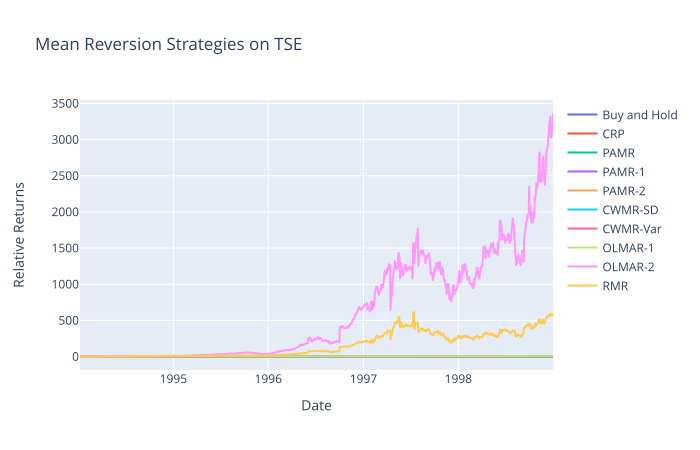

In [71]:
fig = go.Figure()
idx = tse_bah.portfolio_return.index
fig.add_trace(go.Scatter(x=idx, y=tse_bah.portfolio_return['Returns'], name="Buy and Hold"))
fig.add_trace(go.Scatter(x=idx, y=tse_crp.portfolio_return['Returns'], name="CRP"))
fig.add_trace(go.Scatter(x=idx, y=tse_pamr0_.portfolio_return['Returns'], name="PAMR"))
fig.add_trace(go.Scatter(x=idx, y=tse_pamr1_.portfolio_return['Returns'], name="PAMR-1"))
fig.add_trace(go.Scatter(x=idx, y=tse_pamr2_.portfolio_return['Returns'], name="PAMR-2"))
fig.add_trace(go.Scatter(x=idx, y=tse_cwmrsd_.portfolio_return['Returns'], name="CWMR-SD"))
fig.add_trace(go.Scatter(x=idx, y=tse_cwmrvar_.portfolio_return['Returns'], name="CWMR-Var"))
fig.add_trace(go.Scatter(x=idx, y=tse_olmar1_.portfolio_return['Returns'], name="OLMAR-1"))
fig.add_trace(go.Scatter(x=idx, y=tse_olmar2_.portfolio_return['Returns'], name="OLMAR-2"))
fig.add_trace(go.Scatter(x=idx, y=tse_rmr_.portfolio_return['Returns'], name="RMR"))
fig.update_layout(title='Mean Reversion Strategies on TSE', xaxis_title='Date', yaxis_title='Relative Returns')
fig.show()

Similarly to NYSE, TSE's OLMAR-2 and RMR have significantly higher returns than the rest. We will further examine it with a logarithmic scale.

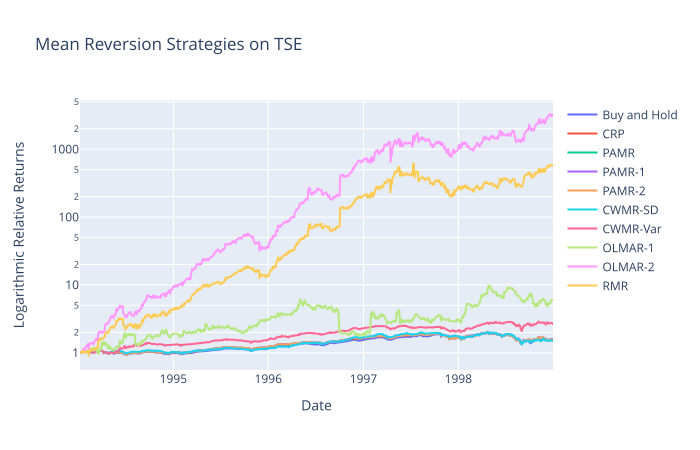

In [72]:
fig.update_layout(yaxis_type="log", yaxis_title='Logarithmic Relative Returns')
fig.show()

OLMAR-2 and RMR continue to lead in highest returns with OLMAR-1 being a distant third.

## SP500: 1998-2003

In [22]:
sp500_pamr0 = optuna.load_study(study_name='pamr0', storage='sqlite:///stored/sp500.db')
sp500_pamr1 = optuna.load_study(study_name='pamr1', storage='sqlite:///stored/sp500.db')
sp500_pamr2 = optuna.load_study(study_name='pamr2', storage='sqlite:///stored/sp500.db')
sp500_cwmrsd = optuna.load_study(study_name='cwmrsd', storage='sqlite:///stored/sp500.db')
sp500_cwmrvar = optuna.load_study(study_name='cwmrvar', storage='sqlite:///stored/sp500.db')
sp500_olmar1 = optuna.load_study(study_name='olmar1_large', storage='sqlite:///stored/sp500.db')
sp500_olmar2 = optuna.load_study(study_name='olmar2_large', storage='sqlite:///stored/sp500.db')
sp500_rmr = optuna.load_study(study_name='rmr', storage='sqlite:///stored/sp500.db')

### PAMR

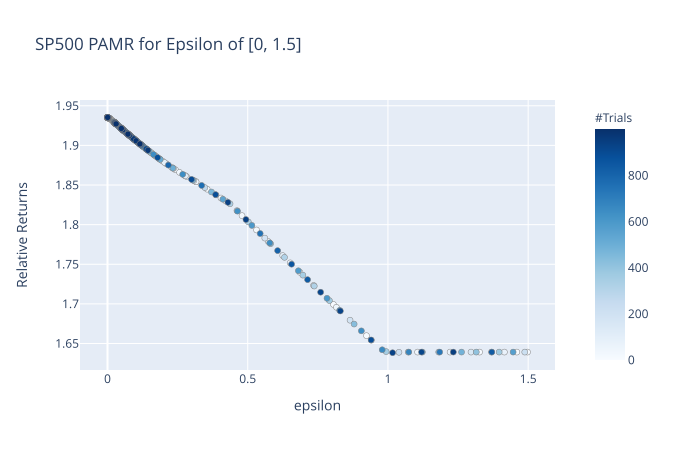

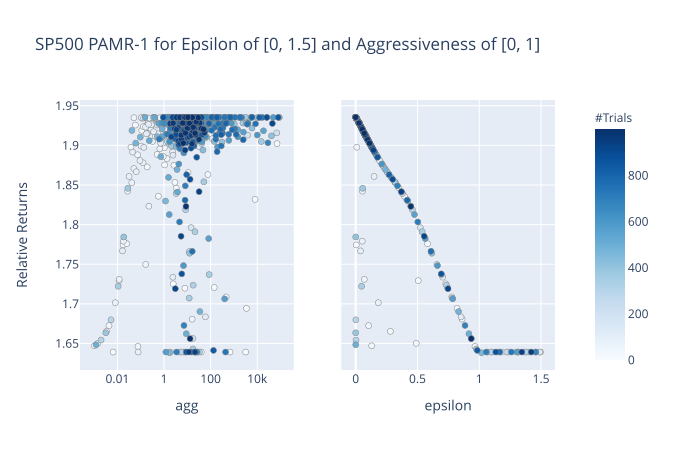

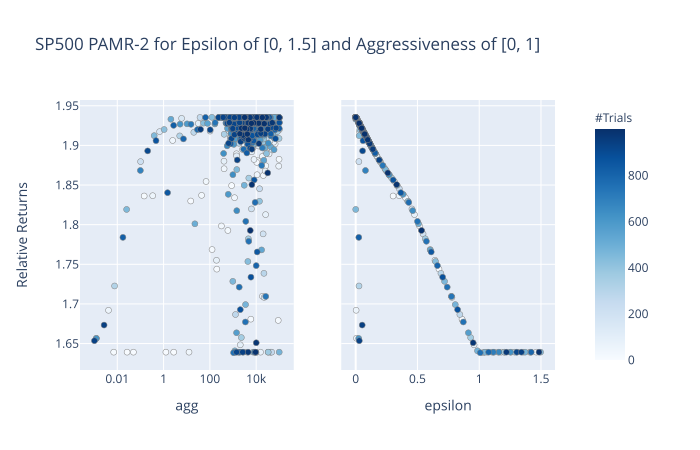

In [75]:
fig = optuna.visualization.plot_slice(sp500_pamr0)
fig.update_layout(title_text="SP500 PAMR for Epsilon of [0, 1.5]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(sp500_pamr1)
fig.update_layout(title_text="SP500 PAMR-1 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(sp500_pamr2)
fig.update_layout(title_text="SP500 PAMR-2 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Epsilon of 0 proved to have the highest returns with agg continue to having minimal impact on our returns.

### CWMR

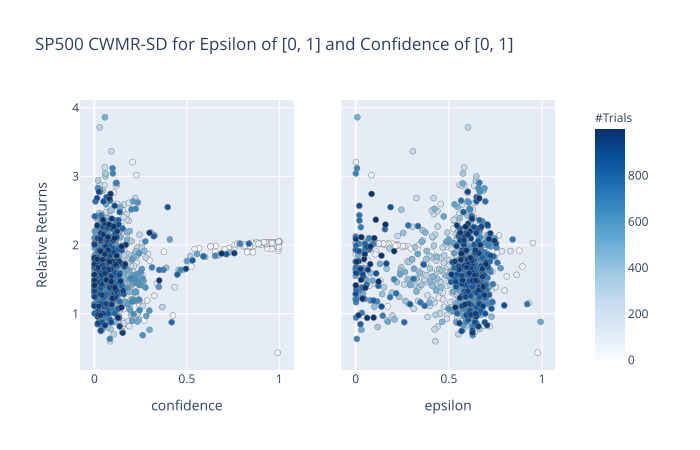

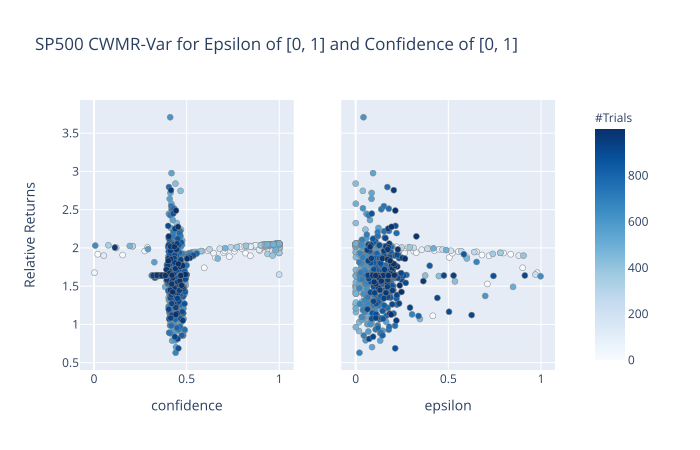

In [24]:
fig = optuna.visualization.plot_slice(sp500_cwmrsd)
fig.update_layout(title_text="SP500 CWMR-SD for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(sp500_cwmrvar)
fig.update_layout(title_text="SP500 CWMR-Var for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

CWMR-SD had ideal parameters closer to 0.1 for confidence with epsilon having minimal impact. On the other hand, CWMR-VAR showed strong correlation with a confidence of 0.45 and epsilon of 0.1.

### OLMAR

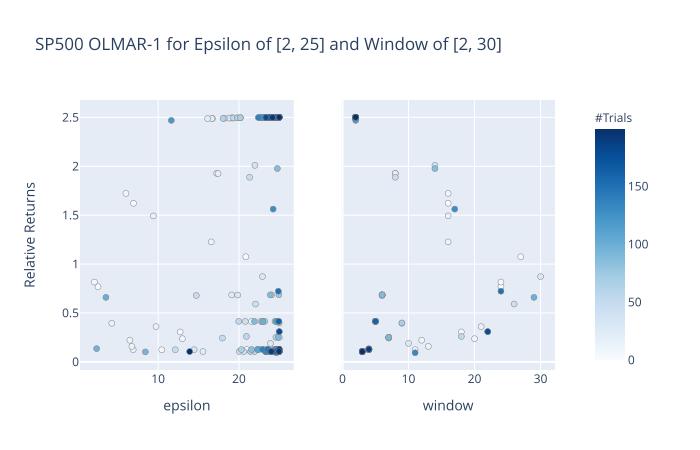

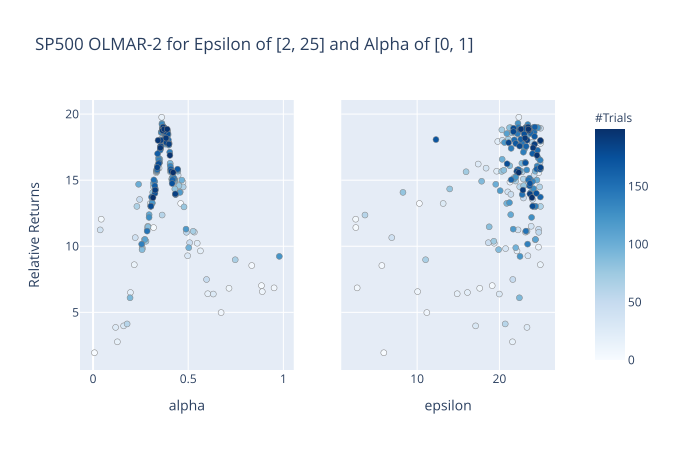

In [25]:
fig = optuna.visualization.plot_slice(sp500_olmar1)
fig.update_layout(title_text="SP500 OLMAR-1 for Epsilon of [2, 25] and Window of [2, 30]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(sp500_olmar2)
fig.update_layout(title_text="SP500 OLMAR-2 for Epsilon of [2, 25] and Alpha of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

For SP500, a window of 2 and alpha of 0.4 produced the highest returns. A shorter mean reversion trend existed in SP500 compared to other datasets.

### RMR

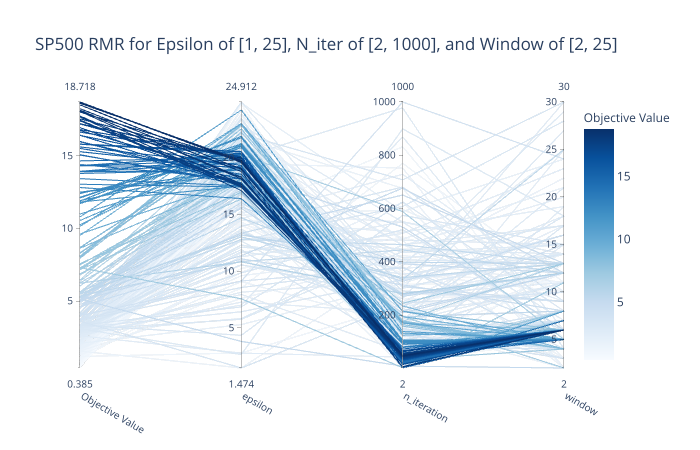

In [78]:
fig = optuna.visualization.plot_parallel_coordinate(sp500_rmr)
fig.update_layout(title_text="SP500 RMR for Epsilon of [1, 25], N_iter of [2, 1000], and Window of [2, 25]", yaxis_title_text="Relative Returns")
display(fig)

RMR hyperparameters were primarily affected by a low number of iterations and window value between 4 and 8.

In [27]:
sp500_bah = BuyAndHold()
sp500_bah.allocate(sp500)
sp500_crp = ConstantRebalancedPortfolio()
sp500_crp.allocate(sp500)

In [28]:
sp500_pamr0_ = PassiveAggressiveMeanReversion(0, sp500_pamr0.best_params['epsilon'])
sp500_pamr1_ = PassiveAggressiveMeanReversion(1, sp500_pamr1.best_params['epsilon'], sp500_pamr1.best_params['agg'])
sp500_pamr2_ = PassiveAggressiveMeanReversion(2, sp500_pamr2.best_params['epsilon'], sp500_pamr2.best_params['agg'])
sp500_cwmrsd_ = ConfidenceWeightedMeanReversion(sp500_cwmrsd.best_params['confidence'], sp500_cwmrsd.best_params['epsilon'],'sd')
sp500_cwmrvar_ = ConfidenceWeightedMeanReversion(sp500_cwmrvar.best_params['confidence'], sp500_cwmrvar.best_params['epsilon'],'var')
sp500_olmar1_ = OnlineMovingAverageReversion(1, sp500_olmar1.best_params['epsilon'], window=sp500_olmar1.best_params['window'])
sp500_olmar2_ = OnlineMovingAverageReversion(2, sp500_olmar2.best_params['epsilon'], alpha=sp500_olmar2.best_params['alpha'])
sp500_rmr_ = RobustMedianReversion(sp500_rmr.best_params['epsilon'], sp500_rmr.best_params['n_iteration'], sp500_rmr.best_params['window'])

In [29]:
sp500_pamr0_.allocate(sp500);
sp500_pamr1_.allocate(sp500);
sp500_pamr2_.allocate(sp500);
sp500_cwmrsd_.allocate(sp500);
sp500_cwmrvar_.allocate(sp500);
sp500_olmar1_.allocate(sp500);
sp500_olmar2_.allocate(sp500);
sp500_rmr_.allocate(sp500);

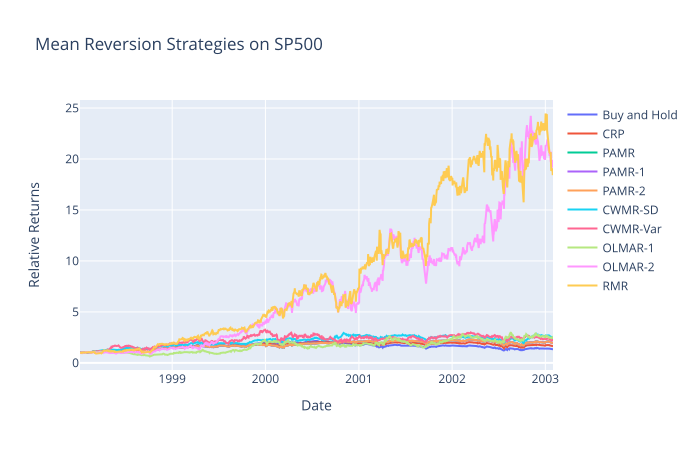

In [79]:
fig = go.Figure()
idx = sp500_bah.portfolio_return.index
fig.add_trace(go.Scatter(x=idx, y=sp500_bah.portfolio_return['Returns'], name="Buy and Hold"))
fig.add_trace(go.Scatter(x=idx, y=sp500_crp.portfolio_return['Returns'], name="CRP"))
fig.add_trace(go.Scatter(x=idx, y=sp500_pamr0_.portfolio_return['Returns'], name="PAMR"))
fig.add_trace(go.Scatter(x=idx, y=sp500_pamr1_.portfolio_return['Returns'], name="PAMR-1"))
fig.add_trace(go.Scatter(x=idx, y=sp500_pamr2_.portfolio_return['Returns'], name="PAMR-2"))
fig.add_trace(go.Scatter(x=idx, y=sp500_cwmrsd_.portfolio_return['Returns'], name="CWMR-SD"))
fig.add_trace(go.Scatter(x=idx, y=sp500_cwmrvar_.portfolio_return['Returns'], name="CWMR-Var"))
fig.add_trace(go.Scatter(x=idx, y=sp500_olmar1_.portfolio_return['Returns'], name="OLMAR-1"))
fig.add_trace(go.Scatter(x=idx, y=sp500_olmar2_.portfolio_return['Returns'], name="OLMAR-2"))
fig.add_trace(go.Scatter(x=idx, y=sp500_rmr_.portfolio_return['Returns'], name="RMR"))
fig.update_layout(title='Mean Reversion Strategies on SP500', xaxis_title='Date', yaxis_title='Relative Returns')
fig.show()

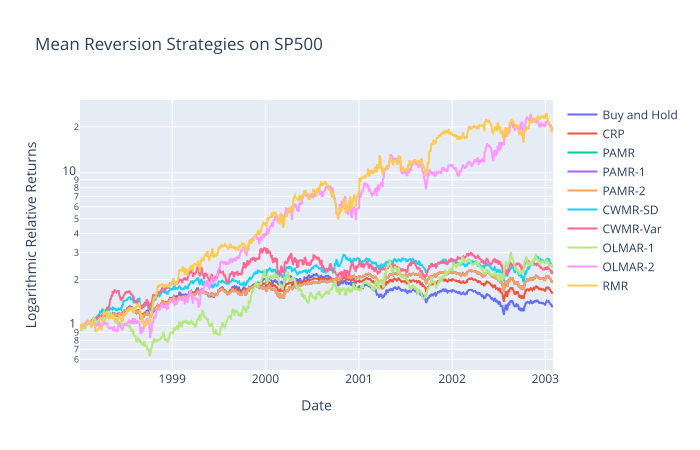

In [80]:
fig.update_layout(yaxis_type="log", yaxis_title='Logarithmic Relative Returns')
fig.show()

Again OLMAR-2 and RMR produce the highest returns. The rest of the strategies fail to increase by more than 2 times the original value.

## MSCI: 1993-2020

In [31]:
msci_pamr0 = optuna.load_study(study_name='pamr0', storage='sqlite:///stored/djia.db')
msci_pamr1 = optuna.load_study(study_name='pamr1', storage='sqlite:///stored/djia.db')
msci_pamr2 = optuna.load_study(study_name='pamr2', storage='sqlite:///stored/djia.db')
msci_cwmrsd = optuna.load_study(study_name='cwmrsd', storage='sqlite:///stored/djia.db')
msci_cwmrvar = optuna.load_study(study_name='cwmrvar', storage='sqlite:///stored/djia.db')
msci_olmar1 = optuna.load_study(study_name='olmar1_large', storage='sqlite:///stored/djia.db')
msci_olmar2 = optuna.load_study(study_name='olmar2_large', storage='sqlite:///stored/djia.db')
msci_rmr = optuna.load_study(study_name='rmr', storage='sqlite:///stored/djia.db')

### PAMR

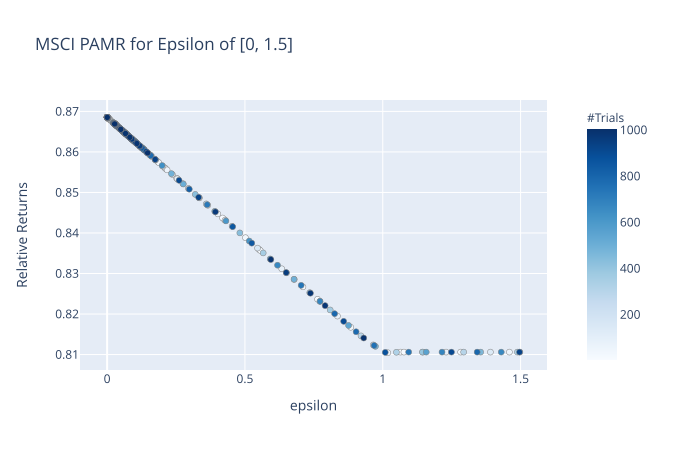

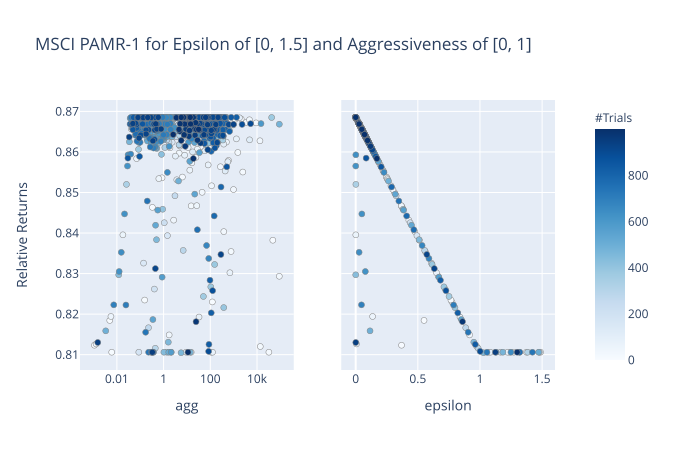

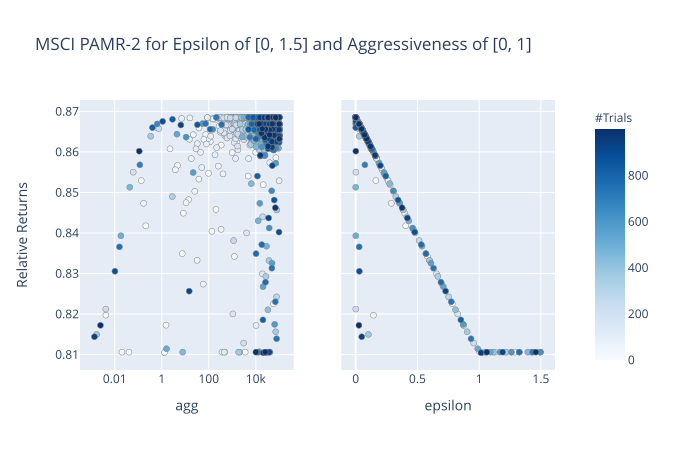

In [81]:
fig = optuna.visualization.plot_slice(msci_pamr0)
fig.update_layout(title_text="MSCI PAMR for Epsilon of [0, 1.5]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(msci_pamr1)
fig.update_layout(title_text="MSCI PAMR-1 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(msci_pamr2)
fig.update_layout(title_text="MSCI PAMR-2 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Epsilon of 0 indicated the highest returns.

### CWMR

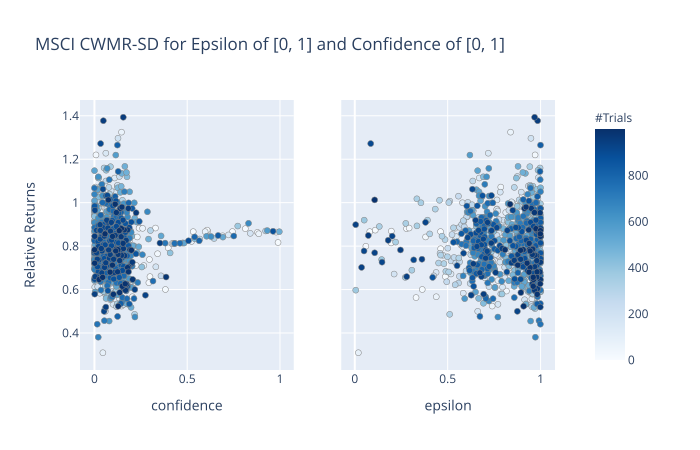

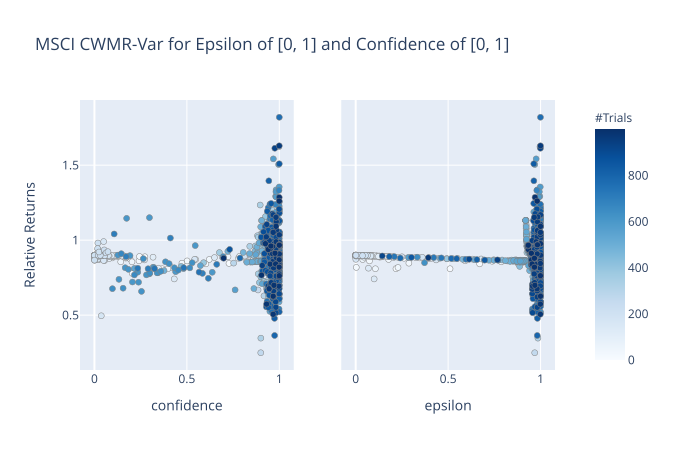

In [35]:
fig = optuna.visualization.plot_slice(msci_cwmrsd)
fig.update_layout(title_text="MSCI CWMR-SD for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(msci_cwmrvar)
fig.update_layout(title_text="MSCI CWMR-Var for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

For both sets, epsilon of 1 had the highest returns with low confidence for CWMR-SD and high confidence for CWMR-Var. CWMR continues to provide models that are extremely sensitive with hyperparameter choices.

### OLMAR

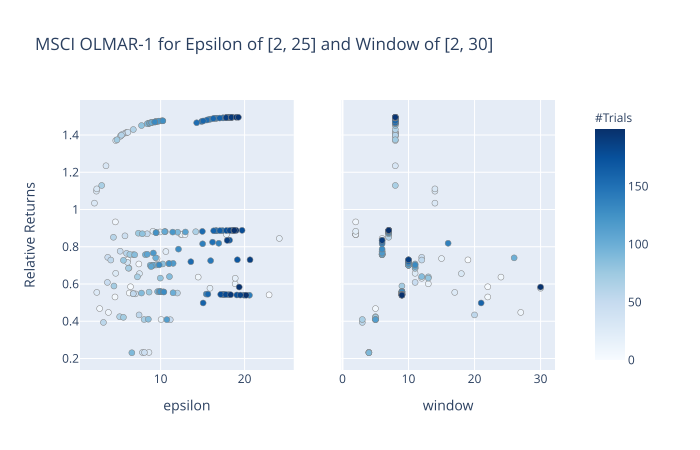

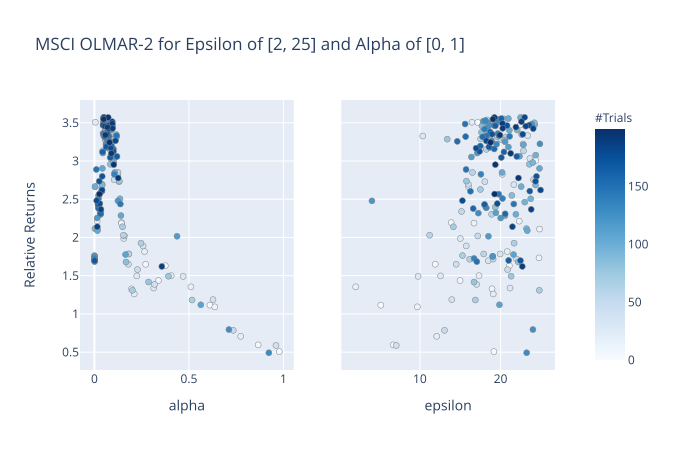

In [37]:
fig = optuna.visualization.plot_slice(msci_olmar1)
fig.update_layout(title_text="MSCI OLMAR-1 for Epsilon of [2, 25] and Window of [2, 30]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(msci_olmar2)
fig.update_layout(title_text="MSCI OLMAR-2 for Epsilon of [2, 25] and Alpha of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Window of 8 and alpha of 0.1 had the highest returns.

### RMR

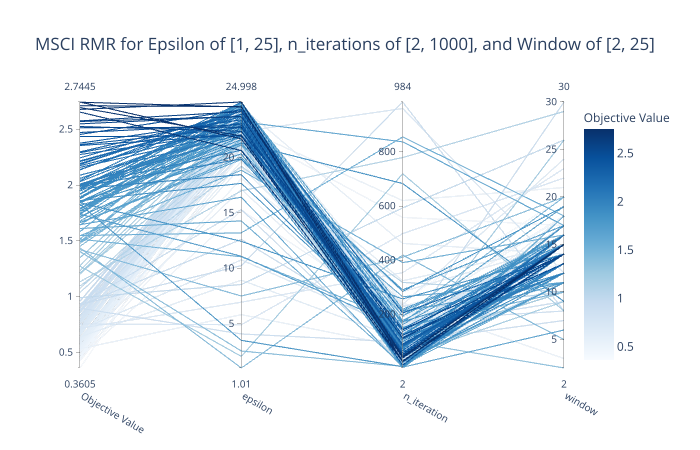

In [38]:
fig = optuna.visualization.plot_parallel_coordinate(msci_rmr)
fig.update_layout(title_text="MSCI RMR for Epsilon of [1, 25], n_iterations of [2, 1000], and Window of [2, 25]", yaxis_title_text="Relative Returns")
display(fig)

RMR values were highest for high epsilon, low n_iteration, and window range of 12 to 15.

In [39]:
msci_bah = BuyAndHold()
msci_bah.allocate(msci)
msci_crp = ConstantRebalancedPortfolio()
msci_crp.allocate(msci)

In [40]:
msci_pamr0_ = PassiveAggressiveMeanReversion(0, msci_pamr0.best_params['epsilon'])
msci_pamr1_ = PassiveAggressiveMeanReversion(1, msci_pamr1.best_params['epsilon'], msci_pamr1.best_params['agg'])
msci_pamr2_ = PassiveAggressiveMeanReversion(2, msci_pamr2.best_params['epsilon'], msci_pamr2.best_params['agg'])
msci_cwmrsd_ = ConfidenceWeightedMeanReversion(msci_cwmrsd.best_params['confidence'], msci_cwmrsd.best_params['epsilon'],'sd')
msci_cwmrvar_ = ConfidenceWeightedMeanReversion(msci_cwmrvar.best_params['confidence'], msci_cwmrvar.best_params['epsilon'],'var')
msci_olmar1_ = OnlineMovingAverageReversion(1, msci_olmar1.best_params['epsilon'], window=msci_olmar1.best_params['window'])
msci_olmar2_ = OnlineMovingAverageReversion(2, msci_olmar2.best_params['epsilon'], alpha=msci_olmar2.best_params['alpha'])
msci_rmr_ = RobustMedianReversion(msci_rmr.best_params['epsilon'], msci_rmr.best_params['n_iteration'], msci_rmr.best_params['window'])

In [41]:
msci_pamr0_.allocate(msci);
msci_pamr1_.allocate(msci);
msci_pamr2_.allocate(msci);
msci_cwmrsd_.allocate(msci);
msci_cwmrvar_.allocate(msci);
msci_olmar1_.allocate(msci);
msci_olmar2_.allocate(msci);
msci_rmr_.allocate(msci);

/Users/alexkwon/Documents/GitHub/hudson-and-thames/mlfinlab/mlfinlab/online_portfolio_selection/mean_reversion/online_moving_average_reversion.py:106: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning



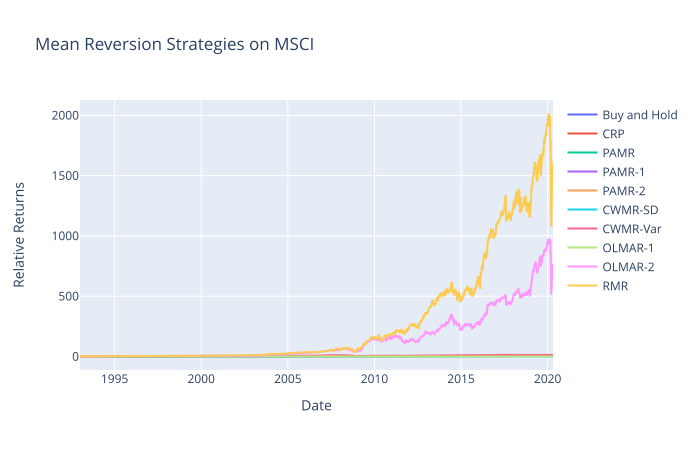

In [82]:
fig = go.Figure()
idx = msci_bah.portfolio_return.index
fig.add_trace(go.Scatter(x=idx, y=msci_bah.portfolio_return['Returns'], name="Buy and Hold"))
fig.add_trace(go.Scatter(x=idx, y=msci_crp.portfolio_return['Returns'], name="CRP"))
fig.add_trace(go.Scatter(x=idx, y=msci_pamr0_.portfolio_return['Returns'], name="PAMR"))
fig.add_trace(go.Scatter(x=idx, y=msci_pamr1_.portfolio_return['Returns'], name="PAMR-1"))
fig.add_trace(go.Scatter(x=idx, y=msci_pamr2_.portfolio_return['Returns'], name="PAMR-2"))
fig.add_trace(go.Scatter(x=idx, y=msci_cwmrsd_.portfolio_return['Returns'], name="CWMR-SD"))
fig.add_trace(go.Scatter(x=idx, y=msci_cwmrvar_.portfolio_return['Returns'], name="CWMR-Var"))
fig.add_trace(go.Scatter(x=idx, y=msci_olmar1_.portfolio_return['Returns'], name="OLMAR-1"))
fig.add_trace(go.Scatter(x=idx, y=msci_olmar2_.portfolio_return['Returns'], name="OLMAR-2"))
fig.add_trace(go.Scatter(x=idx, y=msci_rmr_.portfolio_return['Returns'], name="RMR"))
fig.update_layout(title='Mean Reversion Strategies on MSCI', xaxis_title='Date', yaxis_title='Relative Returns')
fig.show()

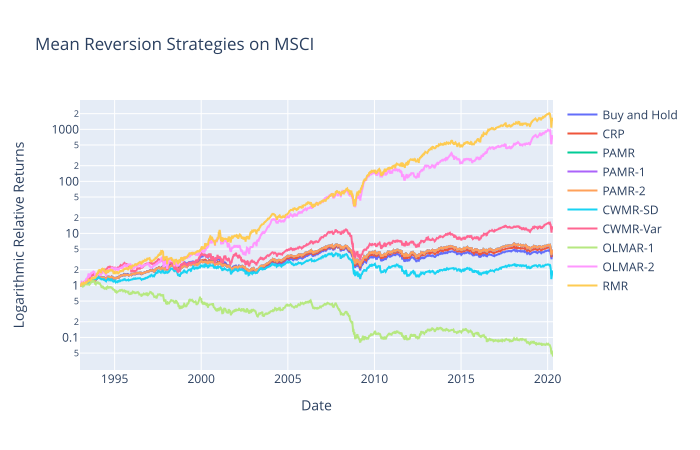

In [83]:
fig.update_layout(yaxis_type="log", yaxis_title='Logarithmic Relative Returns')
fig.show()

Not too surprisingly, OLMAR-2 and RMR produce the highest returns. However, we see OLMAR-1 crashing and approaching 0 at 2020.

## US Equity: 2011-2020

In [43]:
equity_pamr0 = optuna.load_study(study_name='pamr0', storage='sqlite:///stored/equity.db')
equity_pamr1 = optuna.load_study(study_name='pamr1', storage='sqlite:///stored/equity.db')
equity_pamr2 = optuna.load_study(study_name='pamr2', storage='sqlite:///stored/equity.db')
equity_cwmrsd = optuna.load_study(study_name='cwmrsd', storage='sqlite:///stored/equity.db')
equity_cwmrvar = optuna.load_study(study_name='cwmrvar', storage='sqlite:///stored/equity.db')
equity_olmar1 = optuna.load_study(study_name='olmar1_large', storage='sqlite:///stored/equity.db')
equity_olmar2 = optuna.load_study(study_name='olmar2_large', storage='sqlite:///stored/equity.db')
equity_rmr = optuna.load_study(study_name='rmr', storage='sqlite:///stored/equity.db')

### PAMR

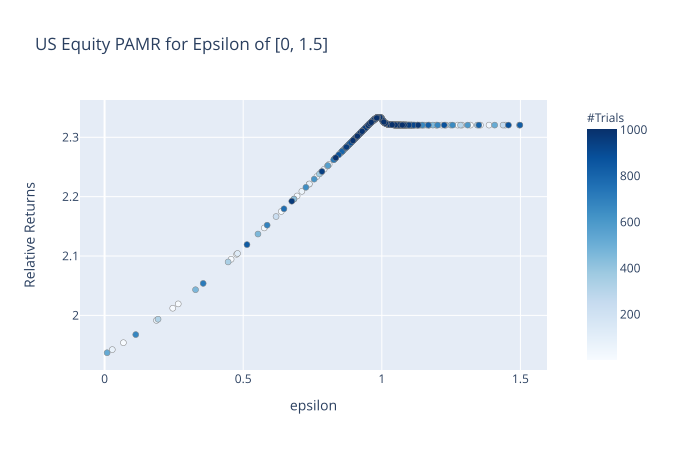

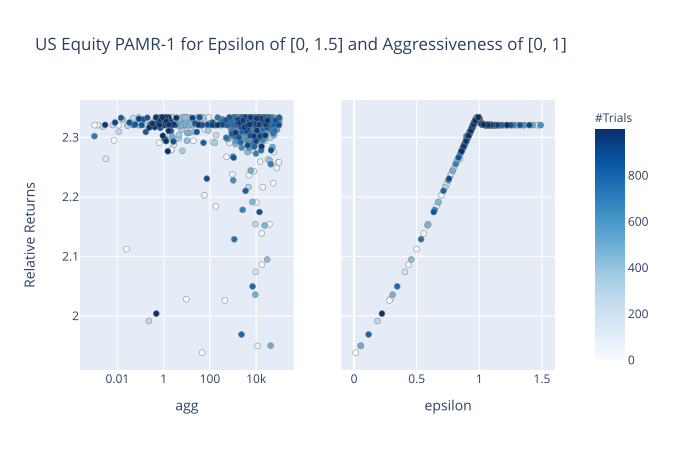

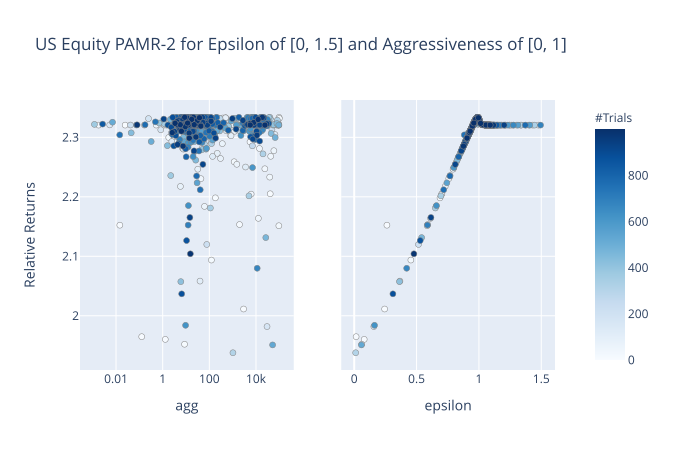

In [45]:
fig = optuna.visualization.plot_slice(equity_pamr0)
fig.update_layout(title_text="US Equity PAMR for Epsilon of [0, 1.5]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(equity_pamr1)
fig.update_layout(title_text="US Equity PAMR-1 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(equity_pamr2)
fig.update_layout(title_text="US Equity PAMR-2 for Epsilon of [0, 1.5] and Aggressiveness of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Epsilon of 1 had teh highest returns.

### CWMR

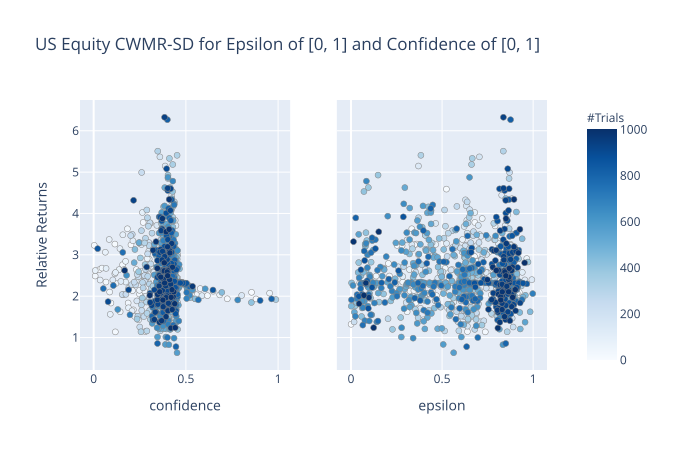

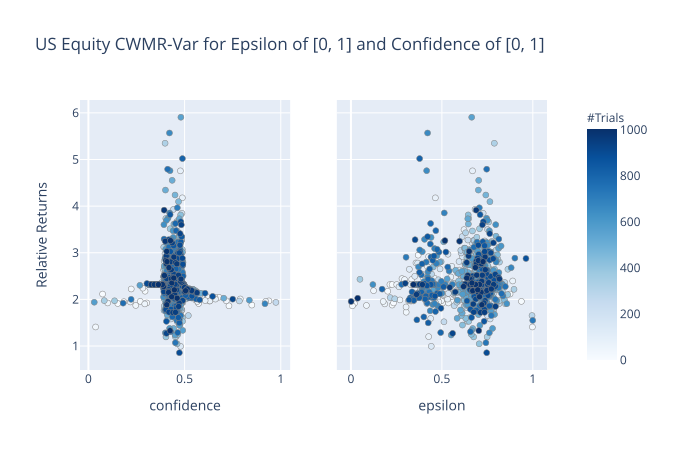

In [46]:
fig = optuna.visualization.plot_slice(equity_cwmrsd)
fig.update_layout(title_text="US Equity CWMR-SD for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(equity_cwmrvar)
fig.update_layout(title_text="US Equity CWMR-Var for Epsilon of [0, 1] and Confidence of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Confidence of 0.45 for both models produced higher returns. However, this model continues to be extremely sensitive to parameter choices.

### OLMAR

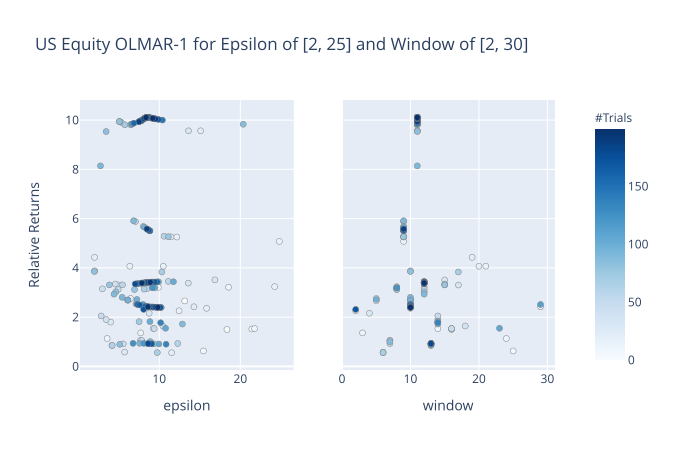

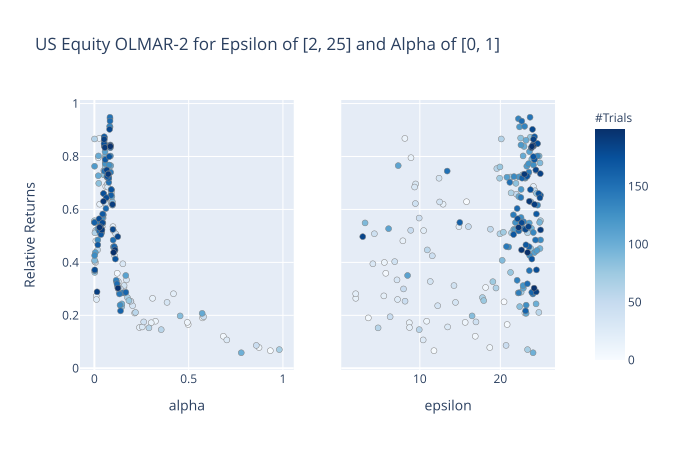

In [47]:
fig = optuna.visualization.plot_slice(equity_olmar1)
fig.update_layout(title_text="US Equity OLMAR-1 for Epsilon of [2, 25] and Window of [2, 30]", yaxis_title_text="Relative Returns")
display(fig)

fig = optuna.visualization.plot_slice(equity_olmar2)
fig.update_layout(title_text="US Equity OLMAR-2 for Epsilon of [2, 25] and Alpha of [0, 1]", yaxis_title_text="Relative Returns")
display(fig)

Window of 11 and alpha of 0.1 proved to have the highest returns.

### RMR

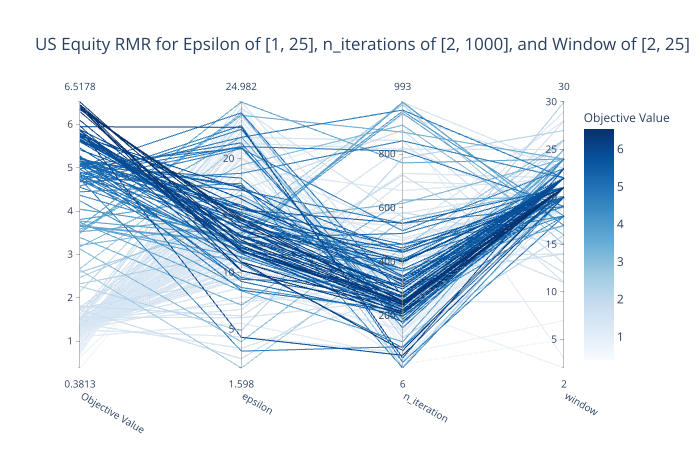

In [48]:
fig = optuna.visualization.plot_parallel_coordinate(equity_rmr)
fig.update_layout(title_text="US Equity RMR for Epsilon of [1, 25], n_iterations of [2, 1000], and Window of [2, 25]", yaxis_title_text="Relative Returns")
display(fig)

RMR's most important parameter was window with a range of 18 to 23.

In [50]:
equity_bah = BuyAndHold()
equity_bah.allocate(us_equity)
equity_crp = ConstantRebalancedPortfolio()
equity_crp.allocate(us_equity)

In [51]:
equity_pamr0_ = PassiveAggressiveMeanReversion(0, equity_pamr0.best_params['epsilon'])
equity_pamr1_ = PassiveAggressiveMeanReversion(1, equity_pamr1.best_params['epsilon'], equity_pamr1.best_params['agg'])
equity_pamr2_ = PassiveAggressiveMeanReversion(2, equity_pamr2.best_params['epsilon'], equity_pamr2.best_params['agg'])
equity_cwmrsd_ = ConfidenceWeightedMeanReversion(equity_cwmrsd.best_params['confidence'], equity_cwmrsd.best_params['epsilon'],'sd')
equity_cwmrvar_ = ConfidenceWeightedMeanReversion(equity_cwmrvar.best_params['confidence'], equity_cwmrvar.best_params['epsilon'],'var')
equity_olmar1_ = OnlineMovingAverageReversion(1, equity_olmar1.best_params['epsilon'], window=equity_olmar1.best_params['window'])
equity_olmar2_ = OnlineMovingAverageReversion(2, equity_olmar2.best_params['epsilon'], alpha=equity_olmar2.best_params['alpha'])
equity_rmr_ = RobustMedianReversion(equity_rmr.best_params['epsilon'], equity_rmr.best_params['n_iteration'], equity_rmr.best_params['window'])

In [52]:
equity_pamr0_.allocate(us_equity);
equity_pamr1_.allocate(us_equity);
equity_pamr2_.allocate(us_equity);
equity_cwmrsd_.allocate(us_equity);
equity_cwmrvar_.allocate(us_equity);
equity_olmar1_.allocate(us_equity);
equity_olmar2_.allocate(us_equity);
equity_rmr_.allocate(us_equity);

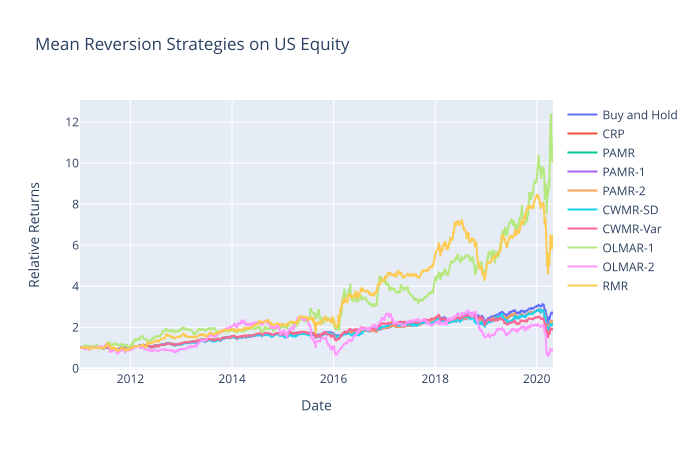

In [53]:
fig = go.Figure()
idx = equity_bah.portfolio_return.index
fig.add_trace(go.Scatter(x=idx, y=equity_bah.portfolio_return['Returns'], name="Buy and Hold"))
fig.add_trace(go.Scatter(x=idx, y=equity_crp.portfolio_return['Returns'], name="CRP"))
fig.add_trace(go.Scatter(x=idx, y=equity_pamr0_.portfolio_return['Returns'], name="PAMR"))
fig.add_trace(go.Scatter(x=idx, y=equity_pamr1_.portfolio_return['Returns'], name="PAMR-1"))
fig.add_trace(go.Scatter(x=idx, y=equity_pamr2_.portfolio_return['Returns'], name="PAMR-2"))
fig.add_trace(go.Scatter(x=idx, y=equity_cwmrsd_.portfolio_return['Returns'], name="CWMR-SD"))
fig.add_trace(go.Scatter(x=idx, y=equity_cwmrvar_.portfolio_return['Returns'], name="CWMR-Var"))
fig.add_trace(go.Scatter(x=idx, y=equity_olmar1_.portfolio_return['Returns'], name="OLMAR-1"))
fig.add_trace(go.Scatter(x=idx, y=equity_olmar2_.portfolio_return['Returns'], name="OLMAR-2"))
fig.add_trace(go.Scatter(x=idx, y=equity_rmr_.portfolio_return['Returns'], name="RMR"))
fig.update_layout(title='Mean Reversion Strategies on US Equity', xaxis_title='Date', yaxis_title='Relative Returns')
fig.show()

Interestingly, OLMAR-1 and RMR were the best performing strategies with OLMAR-2 lagging much behind its peers. This is in contrast with other datasets that we saw.

## Conclusion

Through this notebook, we were able to explore the mean reversion functionalities of MlFinLab's newest Online Portfolio Selection module. Readers were exposed to a basic introduction to the mean reversion strategies and will be able to replicate results using the simple methods of the new module.

The next notebook will focus on Pattern Matching.

If you enjoyed reading this please remember to leave us a star on [GitHub](https://github.com/hudson-and-thames) and join our [Slack](https://join.slack.com/t/mlfinlab/shared_invite/zt-c62u9gpz-VFc13j6da~UVg3DkV7~RjQ) channel to ask us any questions!